# Eval runs

In [9]:
! pip install pandas
! pip install matplotlib
! pip install scipy
! pip install seaborn


[notice] A new release of pip is available: 24.0 -> 24.2
[notice] To update, run: python.exe -m pip install --upgrade pip



[notice] A new release of pip is available: 24.0 -> 24.2
[notice] To update, run: python.exe -m pip install --upgrade pip



[notice] A new release of pip is available: 24.0 -> 24.2
[notice] To update, run: python.exe -m pip install --upgrade pip


   ---------------------------------------- 0.0/294.9 kB ? eta -:--:--
   ---------------------------------------- 0.0/294.9 kB ? eta -:--:--
   ----- --------------------------------- 41.0/294.9 kB 667.8 kB/s eta 0:00:01
   ---------------------- ----------------- 163.8/294.9 kB 2.0 MB/s eta 0:00:01
   -------------------------------------- - 286.7/294.9 kB 2.5 MB/s eta 0:00:01
   ---------------------------------------- 294.9/294.9 kB 2.3 MB/s eta 0:00:00



[notice] A new release of pip is available: 24.0 -> 24.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import pearsonr
from pathlib import Path
import ast
import seaborn as sns

pd.set_option('display.max_columns', None)

In [5]:
def read_metrics_file(file_path):
    df = pd.read_csv(file_path, sep=" ", header=None, names=["Timestamp", "Value", "Label"])[["Value"]].tail(25).max() #.iloc[-1]
    return df

def read_config_file(file_path):
    """
    Read configuration settings from a config.txt file.
    """
    with open(file_path, 'r') as file:
        txt = file.read().replace("device(type='cuda', index=0)", "0")
        config = ast.literal_eval(txt)
    return config

def read_metrics_and_config_from_directory(directory_root):
    """
    Read metrics from all files in a directory and its subdirectories recursively.
    """
    
    run_data = {}
    runs_path = Path(directory_root)
    # Iterate over all runs
    for run_dir in runs_path.glob('**/metrics'):
        metric_data = {}
        for metric_file in run_dir.iterdir():
            metric_data[metric_file.stem] = read_metrics_file(metric_file)
        
        if len(metric_data) == 0:
            print(metric_data)
            print(run_dir)
        combined_df = pd.concat(metric_data, axis=1)
        run_data[(run_dir.parent.parent.name, run_dir.parent.name)] = combined_df

    run_configs = {}
    # Iterate over all runs
    for run_dir in runs_path.glob('**/params'):
        for metric_file in run_dir.iterdir():
            config = read_config_file(metric_file)
        run_configs[(run_dir.parent.parent.name, run_dir.parent.name)] = config

    return run_data, run_configs

def load_dataframe(directory):
    # Read metrics from all files in the directory
    run_data, run_configs = read_metrics_and_config_from_directory(directory)

    modified_dfs = []
    for key, df in run_data.items():
        df['ml_run_experiment'] = key[0]
        df['ml_run_id'] = key[1]
        df['ml_run_name'] = run_configs[key]['RUN_NAME']
        modified_dfs.append(df)
    df_runs = pd.concat(modified_dfs, axis=0, ignore_index=True)
     
    return df_runs, run_configs

# Define the directory containing metric files
directory = 'C:\\Users\\Eduard\\Desktop\\Face\\HM_IDENT_3DFR\\log\\mlruns'
df_runs, run_configs = load_dataframe(directory)
print(df_runs.shape, len(run_configs.items()))
df_runs.head(5)

(436, 124) 436


,bellus_inter_enrolled_center_avg_distance,bellus_intra_enrolled_avg_distance,bellus_intra_query_avg_distance,bellus_intra_scan_avg_distance,bellus_RR1,bellus_RR5,bellus_Voting_RR1,bellus_Voting_RR5,bff_inter_enrolled_center_avg_distance,bff_intra_enrolled_avg_distance,bff_intra_query_avg_distance,bff_intra_scan_avg_distance,bff_RR1,bff_RR5,bff_Voting_RR1,bff_Voting_RR5,facescape_inter_enrolled_center_avg_distance,facescape_intra_enrolled_avg_distance,facescape_intra_query_avg_distance,facescape_intra_scan_avg_distance,facescape_RR1,facescape_RR5,facescape_Voting_RR1,facescape_Voting_RR5,faceverse_inter_enrolled_center_avg_distance,faceverse_intra_enrolled_avg_distance,faceverse_intra_query_avg_distance,faceverse_intra_scan_avg_distance,faceverse_RR1,faceverse_RR5,faceverse_Voting_RR1,faceverse_Voting_RR5,test_lfw_deepfunneled_Acc,texas_RR1,texas_RR5,texas_Voting_RR1,texas_Voting_RR5,Training_Accuracy,train_loss,ml_run_experiment,ml_run_id,ml_run_name,bellus_enrolled_davies_bouldin_score,bellus_enrolled_mean_norm,bellus_enrolled_silhouette_score,bellus_enrolled_std_norm,bellus_KNNVoting_RR1,bellus_KNNVoting_RR5,bellus_query_davies_bouldin_score,bellus_query_mean_norm,bellus_query_silhouette_score,bellus_query_std_norm,bff_enrolled_davies_bouldin_score,bff_enrolled_mean_norm,bff_enrolled_silhouette_score,bff_enrolled_std_norm,bff_KNNVoting_RR1,bff_KNNVoting_RR5,bff_query_davies_bouldin_score,bff_query_mean_norm,bff_query_silhouette_score,bff_query_std_norm,facescape_enrolled_davies_bouldin_score,facescape_enrolled_mean_norm,facescape_enrolled_silhouette_score,facescape_enrolled_std_norm,facescape_KNNVoting_RR1,facescape_KNNVoting_RR5,facescape_query_davies_bouldin_score,facescape_query_mean_norm,facescape_query_silhouette_score,facescape_query_std_norm,faceverse_enrolled_davies_bouldin_score,faceverse_enrolled_mean_norm,faceverse_enrolled_silhouette_score,faceverse_enrolled_std_norm,faceverse_KNNVoting_RR1,faceverse_KNNVoting_RR5,faceverse_query_davies_bouldin_score,faceverse_query_mean_norm,faceverse_query_silhouette_score,faceverse_query_std_norm,photo_bellus_enrolled_davies_bouldin_score,photo_bellus_enrolled_mean_norm,photo_bellus_enrolled_silhouette_score,photo_bellus_enrolled_std_norm,photo_bellus_inter_enrolled_center_avg_distance,photo_bellus_intra_enrolled_avg_distance,photo_bellus_intra_query_avg_distance,photo_bellus_intra_scan_avg_distance,photo_bellus_KNNVoting_RR1,photo_bellus_KNNVoting_RR5,photo_bellus_query_davies_bouldin_score,photo_bellus_query_mean_norm,photo_bellus_query_silhouette_score,photo_bellus_query_std_norm,photo_bellus_RR1,photo_bellus_RR5,photo_bellus_Voting_RR1,photo_bellus_Voting_RR5,texas_KNNVoting_RR1,texas_KNNVoting_RR5,bellus_Front_RR1,bff_Front_RR1,facescape_Front_RR1,faceverse_Front_RR1,photo_bellus_Front_RR1,photo_colorferet1_n_enrolled_davies_bouldin_score,photo_colorferet1_n_enrolled_mean_norm,photo_colorferet1_n_enrolled_silhouette_score,photo_colorferet1_n_enrolled_std_norm,photo_colorferet1_n_Front_RR1,photo_colorferet1_n_inter_enrolled_center_avg_distance,photo_colorferet1_n_intra_enrolled_avg_distance,photo_colorferet1_n_intra_query_avg_distance,photo_colorferet1_n_intra_scan_avg_distance,photo_colorferet1_n_KNNVoting_RR1,photo_colorferet1_n_query_davies_bouldin_score,photo_colorferet1_n_query_mean_norm,photo_colorferet1_n_query_silhouette_score,photo_colorferet1_n_query_std_norm,photo_colorferet1_n_RR1,photo_colorferet1_n_RR5,photo_colorferet1_n_Voting_RR1
0,1.019957,8.679480,41.185195,8.618463,68.67,86.12,87.39,87.39,0.996193,9.100664,159.732537,8.057873,38.97,62.96,80.27,80.27,0.998352,10.257738,172.378736,8.768594,45.47,69.40,89.75,89.75,1.004698,9.033436,199.864525,9.192586,47.10,70.76,72.36,72.36,0.647167,45.01,61.67,45.01,45.01,2.395833,22.824797,101451452033972361,11178ddfa1b54f11a8e06545e0e613f5,EXP123-photo_ffhq-1000T_25P-enc_512-ArcFace-Fo...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN

In [6]:
#def translate_mlflow_to_experiment_name(run_configs, mlflow_run_experiment_ids, ml_run_ids):
#    x_ticks = []
#    for e,i in zip(mlflow_run_experiment_ids, ml_run_ids):
#        x_ticks.append(run_configs[(e,i)]['RUN_NAME'])
#    
#    unique_list = []
#    [unique_list.append(x) for x in x_ticks if x not in unique_list]
#    return unique_list

def plot_bar(df, rotation=45, figsize=(20, 10), voting = 'V1', id_vars='ml_run_experiment', color_list=['blue','skyblue', 'orange', 'lightgreen','pink','red','gold']) :# bar_columns, labels, title_suffix, color_list, rotation=45, annotate=True):

    ml_run_name = df['ml_run_name']
    xticks = []
    [xticks.append(x) for x in ml_run_name if x not in xticks]

    indices = np.arange(len(xticks))
    if voting == True:
        test_columns = ['photo_bellus_Voting_RR1', 'bellus_Voting_RR1', 'facescape_Voting_RR1', 'faceverse_Voting_RR1', 'bff_Voting_RR1']
    elif voting == 'KNN':
        test_columns = ['photo_bellus_KNNVoting_RR1', 'bellus_KNNVoting_RR1', 'facescape_KNNVoting_RR1', 'faceverse_KNNVoting_RR1', 'bff_KNNVoting_RR1']
    else:
        test_columns = ['photo_bellus_RR1', 'bellus_RR1', 'facescape_RR1', 'faceverse_RR1', 'bff_RR1', 'texas_RR1', 'test_lfw_deepfunneled_Acc']

    df['test_lfw_deepfunneled_Acc'] = df['test_lfw_deepfunneled_Acc'] * 100

    df_melted = pd.melt(df, id_vars=[id_vars], value_vars=test_columns, 
                    var_name='Measure', value_name='Value')

    plt.figure(figsize=figsize)
    ax = sns.barplot(data=df_melted, x='ml_run_experiment', y='Value', hue='Measure', errorbar=('ci', 95), capsize=0.1, palette=color_list)

    # Add average values as text to the bars
    for container in ax.containers:
        ax.bar_label(container, fmt="%.2f", label_type="edge")

    # Add horizontal lines for the rr_5 accuracies
    #top5_columns = ['bellus_RR5', 'facescape_RR5', 'faceverse_RR5', 'texas_RR5']
    #unique_experiments = df['ml_run_experiment'].unique()
    #width = 0.8 / len(unique_experiments)
    #for i, col in enumerate(top5_columns):
    #    for j, (experiment, value) in enumerate(zip(df['ml_run_experiment'], df[col])):
    ##        # Correct indexing for line positions
    #        x_position = j - width/2 + i*width + width/2
    #        plt.hlines(y=value, xmin=x_position - width/2, xmax=x_position + width/2, 
    #                colors=color_list[i], linestyles='dashed')
    #        plt.text(x_position, value, f'{value:.2f}', 
    #                ha='center', va='bottom', color=color_list[i])
    plt.xlabel('Experiment')
    plt.ylabel('Accuracy')
    plt.xticks(indices, xticks, rotation=rotation, ha='right')
    plt.tight_layout()

def analyse_embedding(df):
    plot_scatter_with_correlation_line(df['bellus_RR1'], df['bellus_inter_enrolled_center_avg_distance'], df['ml_run_experiment'], 'bellusRR1', 'bellus_inter_enrolled_center_avg_distance')
    plot_scatter_with_correlation_line(df['facescape_RR1'], df['facescape_inter_enrolled_center_avg_distance'], df['ml_run_experiment'], 'facescapeRR1', 'facescape_inter_enrolled_center_avg_distance')
    plot_scatter_with_correlation_line(df['bellus_RR1'], df['bellus_intra_enrolled_avg_distance'], df['ml_run_experiment'], 'bellusRR1', 'bellus_intra_enrolled_avg_distance')
    plot_scatter_with_correlation_line(df['facescape_RR1'], df['facescape_intra_enrolled_avg_distance'], df['ml_run_experiment'], 'facescapeRR1', 'facescape_intra_enrolled_avg_distance')
    plot_scatter_with_correlation_line(df['bellus_RR1'], df['bellus_intra_query_avg_distance'], df['ml_run_experiment'], 'bellusRR1', 'bellus_intra_query_avg_distance')
    plot_scatter_with_correlation_line(df['facescape_RR1'], df['facescape_intra_query_avg_distance'], df['ml_run_experiment'], 'facescapeRR1', 'facescape_intra_query_avg_distance')
    plot_scatter_with_correlation_line(df['bellus_RR1'], df['bellus_intra_scan_avg_distance'], df['ml_run_experiment'], 'bellusRR1', 'bellus_intra_scan_avg_distance')
    plot_scatter_with_correlation_line(df['facescape_RR1'], df['facescape_intra_scan_avg_distance'], df['ml_run_experiment'], 'facescapeRR1', 'facescape_intra_scan_avg_distance')
    plt.show()

def plot_scatter_with_correlation_line(x, y, labels, xlabel, ylabel):
    plt.figure(figsize=(7, 7))
    coefficients = np.polyfit(x, y, 1)
    poly = np.poly1d(coefficients)
    val_linspace = np.linspace(min(x), max(x), len(x))
    plt.scatter(x, y, color='green')
    plt.plot(val_linspace, poly(val_linspace), color='blue', linestyle='dashed', linewidth=2)
    for i, label in enumerate(labels):
        plt.text(x.iloc[i], y.iloc[i], label, fontsize=9, ha='right')
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.tight_layout()
    correlation_coefficient, _ = pearsonr(x, y)
    print(f"Correlation coefficient: {correlation_coefficient:.3f}")
    
    
def analyze_accuracies(df, run_configs, voting, id_vars='ml_run_experiment'):
    #xticks = translate_mlflow_to_experiment_name(run_configs, df['ml_run_experiment'], df['ml_run_id'])
    plot_bar(df, voting=voting, id_vars=id_vars)
    plt.show()


def analyze_accuracies_grouped(df, run_configs, voting):
    #xticks = translate_mlflow_to_experiment_name(run_configs, df['ml_run_experiment'], df['ml_run_id'])
    plot_bar_grouped(df, voting=voting)
    plt.show()


def select_runs(df, run_configs, rules):

    valid_keys = []
    for k,v in run_configs.items():
        accept = False
        for i in rules:
            if i in v['RUN_NAME']:
                accept = True
                break
        if accept:
            valid_keys.append(k[0])

    print('Selected:', len(valid_keys), valid_keys)

    filtered_df = df[df['ml_run_experiment'].isin(valid_keys)].copy()
    
    if filtered_df.shape[0] != len(valid_keys):
        print(filtered_df.shape[0], len(valid_keys))
        print(len(valid_keys), valid_keys)
        print(filtered_df.head())
        raise Exception('filtered_df.shape[0] != len(valid_keys)')

    filtered_df['exp_id'] = filtered_df['ml_run_name'].str.extract(r'EXP(\d+)', expand=False).astype(int)
    filtered_df = filtered_df.sort_values('exp_id')
    return filtered_df



def compare(df, run_configs, experiments_list):
    columns_to_calculate = ['bellus_Voting_RR1', 'facescape_Voting_RR1', 'faceverse_Voting_RR1', 'texas_Voting_RR1']

    groups = []
    for i in experiments_list:
        groups.append(select_runs(df_runs, run_configs, i)[columns_to_calculate].mean())
    
    combined_means = pd.concat(groups, axis=1).T

    ax = combined_means.plot(kind='bar', figsize=(10, 6))
    plt.title('Comparison')
    plt.xlabel('Columns')
    plt.ylabel('Mean Value')
    plt.xticks(rotation=0)
    plt.legend(title='Groups')
    for p in ax.patches:
        ax.annotate(f'{p.get_height():.2f}', 
                    (p.get_x() + p.get_width() / 2., p.get_height()), 
                    ha='center', va='center', 
                    xytext=(0, 9), textcoords='offset points')
    plt.show()


### EXP [1-6] rgb_bellus-45T_25P-enc_512-ArcFace-FocalLoss-112_112-batchsize_32-epochs50-\<MODEL\>

Selected: 18 ['222100124645481631', '222100124645481631', '222100124645481631', '363882690831110193', '363882690831110193', '363882690831110193', '415785875395131241', '415785875395131241', '415785875395131241', '491028380339639148', '491028380339639148', '491028380339639148', '748894875499767044', '748894875499767044', '748894875499767044', '891246952177035504', '891246952177035504', '891246952177035504']


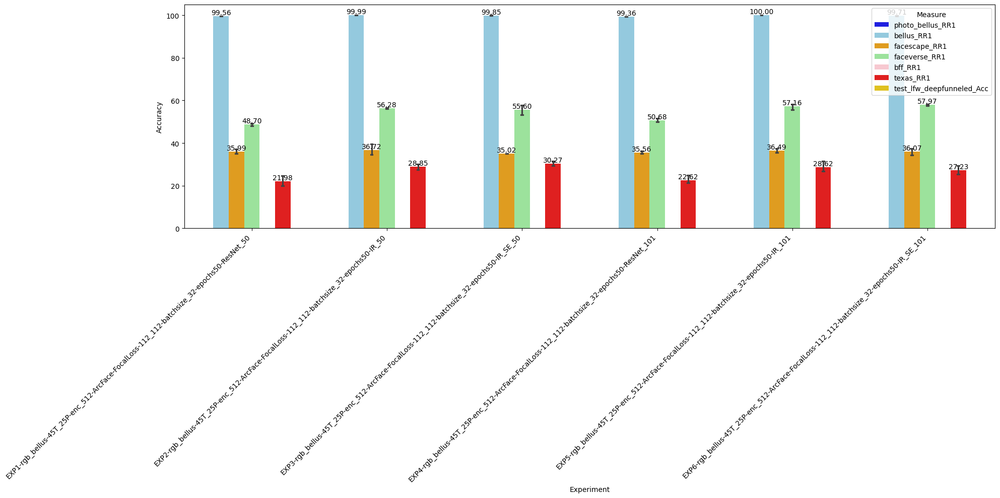

C:\Users\Eduard\AppData\Local\Temp\ipykernel_11156\4151058673.py:30: UserWarning: The palette list has more values (7) than needed (5), which may not be intended.
  ax = sns.barplot(data=df_melted, x='ml_run_experiment', y='Value', hue='Measure', errorbar=('ci', 95), capsize=0.1, palette=color_list)


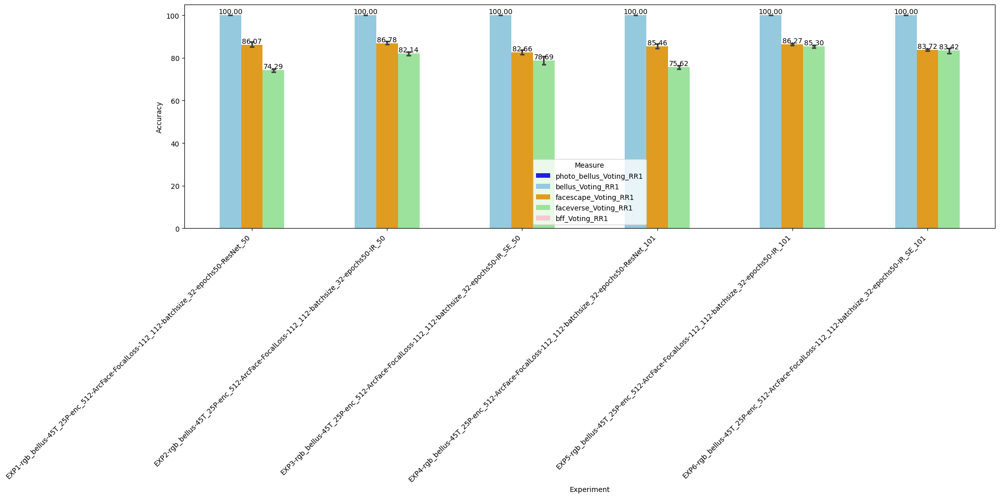

In [32]:
df_selected = select_runs(df_runs, run_configs, ['EXP1-','EXP2-','EXP3-','EXP4-','EXP5-','EXP6-'])
analyze_accuracies(df_selected, run_configs, voting=False)
analyze_accuracies(df_selected, run_configs, voting=True)
#analyse_embedding(df_selected)

### EXP [7-12] depth_bellus-45T_25P-enc_512-ArcFace-FocalLoss-112_112-batchsize_32-epochs50-\<MODEL\>

Selected: 17 ['345097637784570927', '345097637784570927', '345097637784570927', '475567269307092217', '475567269307092217', '475567269307092217', '498748654963359631', '498748654963359631', '498748654963359631', '761951322906666558', '761951322906666558', '828788881478631883', '828788881478631883', '828788881478631883', '926074714150533979', '926074714150533979', '926074714150533979']


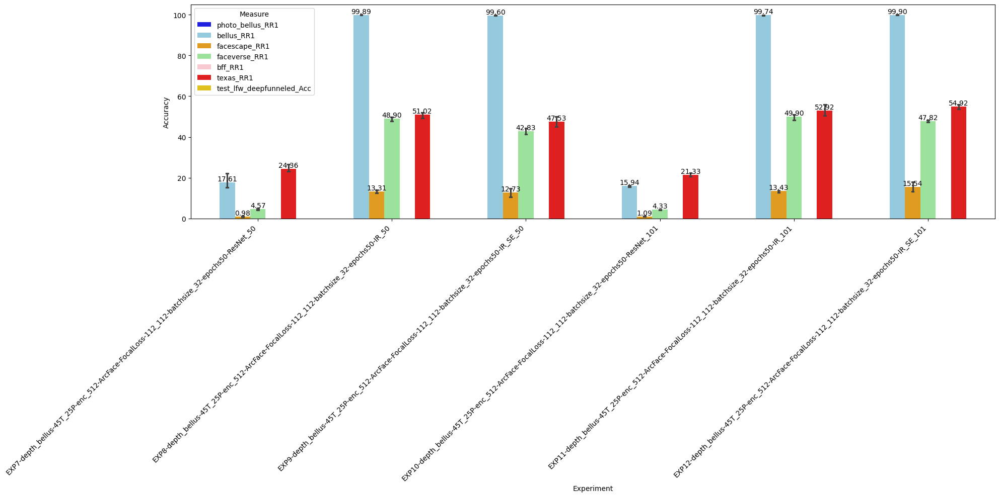

C:\Users\Eduard\AppData\Local\Temp\ipykernel_11156\4151058673.py:30: UserWarning: The palette list has more values (7) than needed (5), which may not be intended.
  ax = sns.barplot(data=df_melted, x='ml_run_experiment', y='Value', hue='Measure', errorbar=('ci', 95), capsize=0.1, palette=color_list)


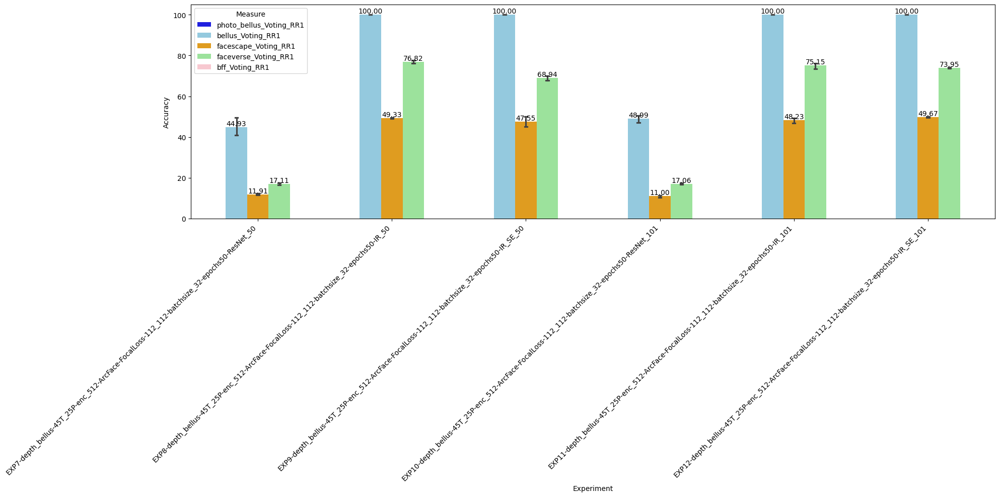

In [33]:
df_selected = select_runs(df_runs, run_configs, ['EXP7-','EXP8-','EXP9-','EXP10-','EXP11-','EXP12-'])
analyze_accuracies(df_selected, run_configs, voting=False)
analyze_accuracies(df_selected, run_configs, voting=True)
#analyse_embedding(df_selected)

### EXP [13-18] rgbd_bellus-45T_25P-enc_512-ArcFace-FocalLoss-112_112-batchsize_32-epochs50-\<MODEL\>

Selected: 18 ['113129204246726823', '113129204246726823', '113129204246726823', '684526817602124812', '684526817602124812', '684526817602124812', '898263092529228606', '898263092529228606', '898263092529228606', '968146518580656468', '968146518580656468', '968146518580656468', '990636790004825293', '990636790004825293', '990636790004825293', '992720557218550828', '992720557218550828', '992720557218550828']


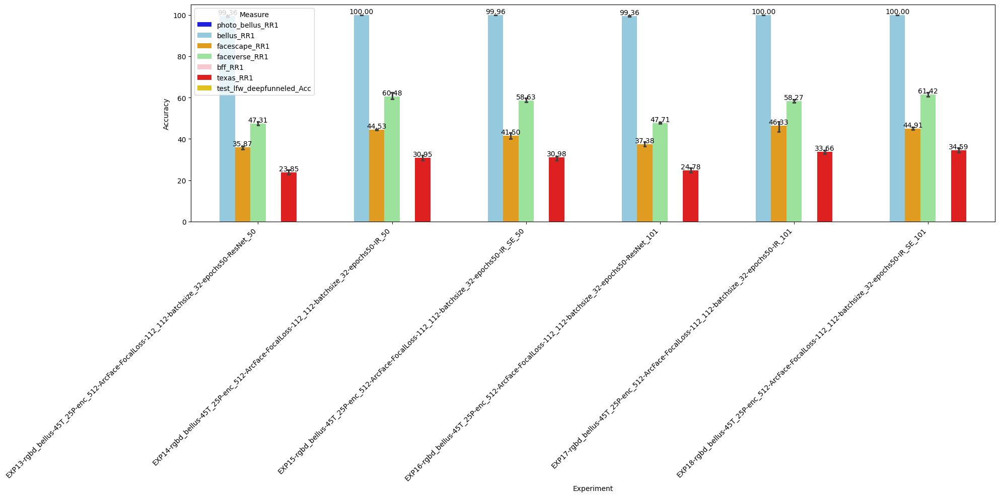

C:\Users\Eduard\AppData\Local\Temp\ipykernel_11156\4151058673.py:30: UserWarning: The palette list has more values (7) than needed (5), which may not be intended.
  ax = sns.barplot(data=df_melted, x='ml_run_experiment', y='Value', hue='Measure', errorbar=('ci', 95), capsize=0.1, palette=color_list)


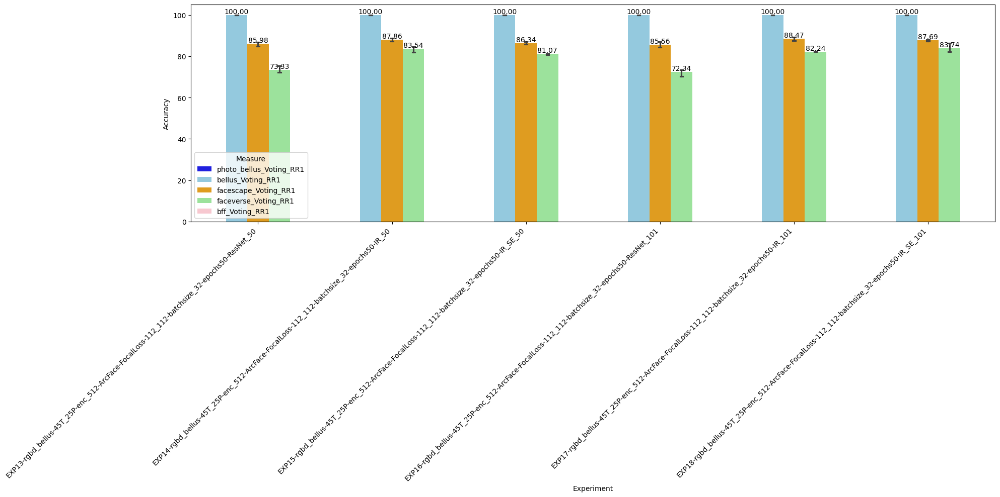

In [34]:
df_selected = select_runs(df_runs, run_configs, ['EXP13-','EXP14-','EXP15-','EXP16-','EXP17-','EXP18-'])
analyze_accuracies(df_selected, run_configs, voting=False)
analyze_accuracies(df_selected, run_configs, voting=True)
#analyse_embedding(df_selected)

### EXP [13-24] rgbd_bellus-45T_25P-enc_512-ArcFace-FocalLoss-112_112-batchsize_[16/32]-epochs50-\<MODEL\>

Selected: 35 ['113129204246726823', '113129204246726823', '113129204246726823', '198001218989780979', '198001218989780979', '198001218989780979', '326301526227812475', '326301526227812475', '326301526227812475', '449428032172154329', '449428032172154329', '565141924842480235', '565141924842480235', '565141924842480235', '684526817602124812', '684526817602124812', '684526817602124812', '718201582151568174', '718201582151568174', '718201582151568174', '898263092529228606', '898263092529228606', '898263092529228606', '925354295638808217', '925354295638808217', '925354295638808217', '968146518580656468', '968146518580656468', '968146518580656468', '990636790004825293', '990636790004825293', '990636790004825293', '992720557218550828', '992720557218550828', '992720557218550828']


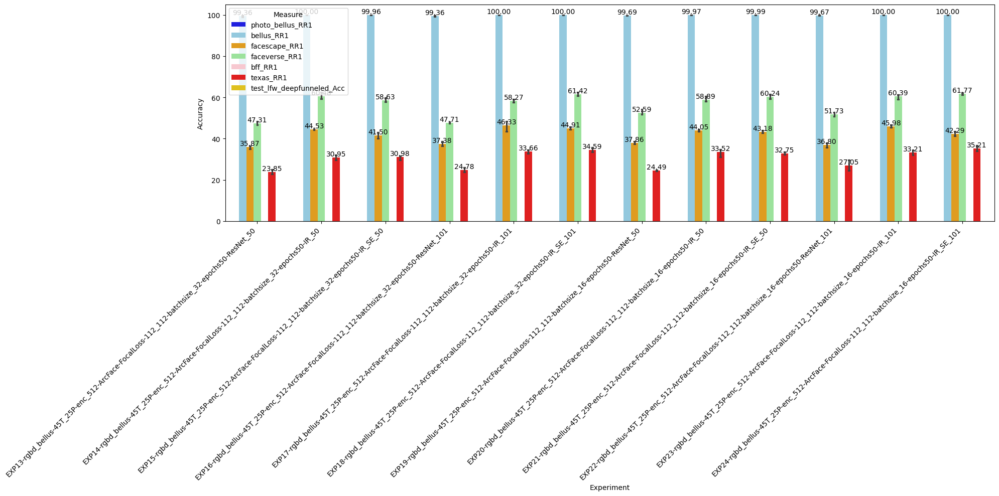

C:\Users\Eduard\AppData\Local\Temp\ipykernel_11156\4151058673.py:30: UserWarning: The palette list has more values (7) than needed (5), which may not be intended.
  ax = sns.barplot(data=df_melted, x='ml_run_experiment', y='Value', hue='Measure', errorbar=('ci', 95), capsize=0.1, palette=color_list)


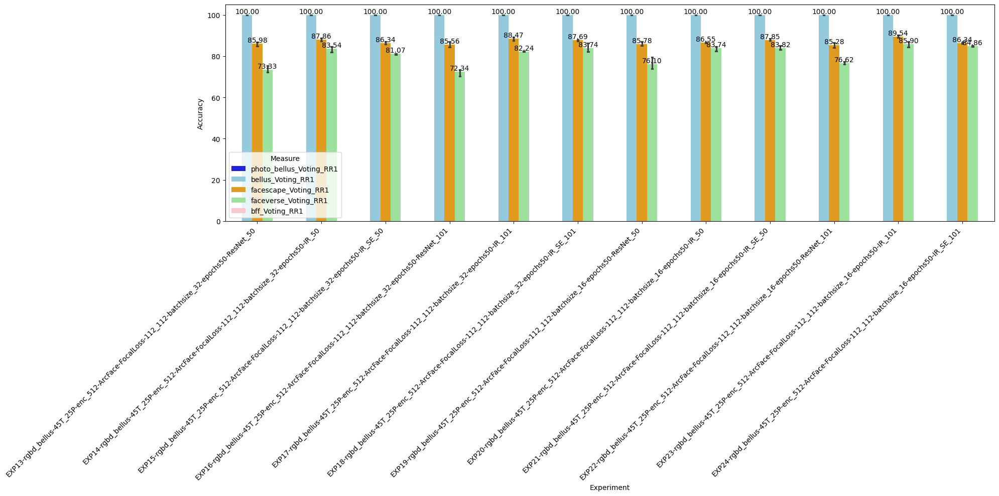

In [35]:
df_selected = select_runs(df_runs, run_configs, ['EXP13-','EXP14-','EXP15-','EXP16-','EXP17-','EXP18-', 'EXP19-','EXP20-','EXP21-','EXP22-','EXP23-','EXP24-'])
analyze_accuracies(df_selected, run_configs, voting=False)
analyze_accuracies(df_selected, run_configs, voting=True)

### EXP [25-30] rgbd_facescape-500T_25P-enc_512-ArcFace-FocalLoss-112_112-batchsize_16-epochs50-\<MODEL\>

Selected: 10 ['380965190370791752', '380965190370791752', '412072104339477621', '412072104339477621', '412072104339477621', '608991125006381188', '658051556357491206', '670741189408236172', '670741189408236172', '888135547068834241']


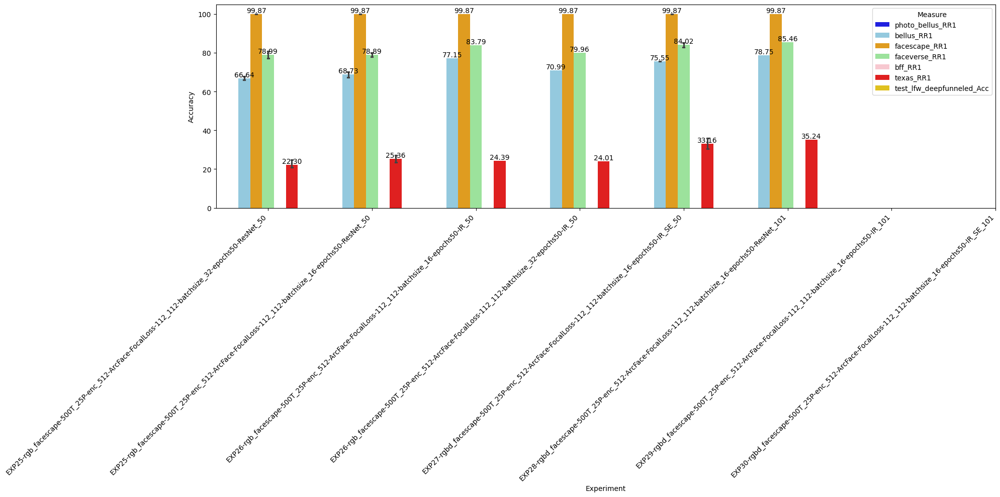

C:\Users\Eduard\AppData\Local\Temp\ipykernel_11156\4151058673.py:30: UserWarning: The palette list has more values (7) than needed (5), which may not be intended.
  ax = sns.barplot(data=df_melted, x='ml_run_experiment', y='Value', hue='Measure', errorbar=('ci', 95), capsize=0.1, palette=color_list)


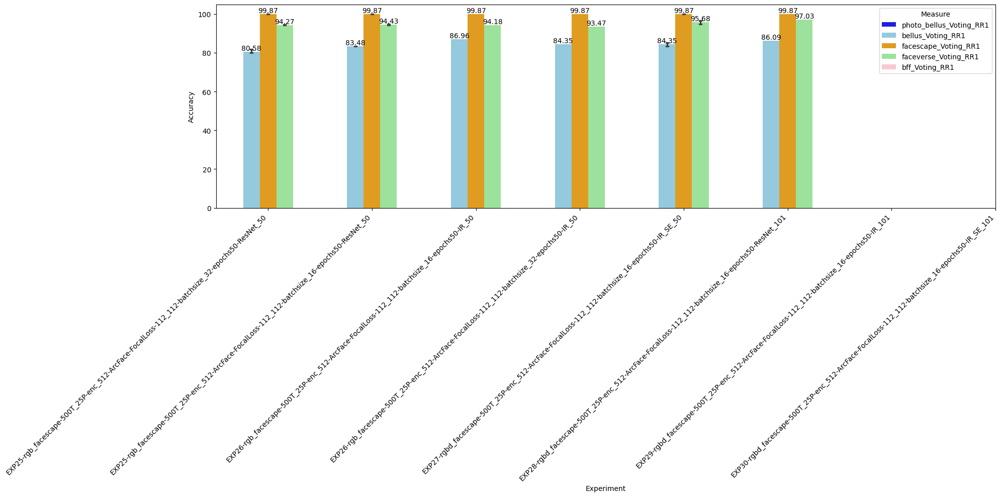

In [36]:
df_selected = select_runs(df_runs, run_configs, ['EXP25-','EXP26-','EXP27-','EXP28-','EXP29-','EXP30-'])
analyze_accuracies(df_selected, run_configs, voting=False)
analyze_accuracies(df_selected, run_configs, voting=True)

### EXP [31-36] depth_facescape-500T_25P-enc_512-ArcFace-FocalLoss-112_112-batchsize_16-epochs50-\<MODEL\>

Selected: 11 ['221021306140145340', '254565957053446777', '746262022341731760', '813627838239030629', '813627838239030629', '813627838239030629', '813627838239030629', '813627838239030629', '813627838239030629', '813627838239030629', '813627838239030629']


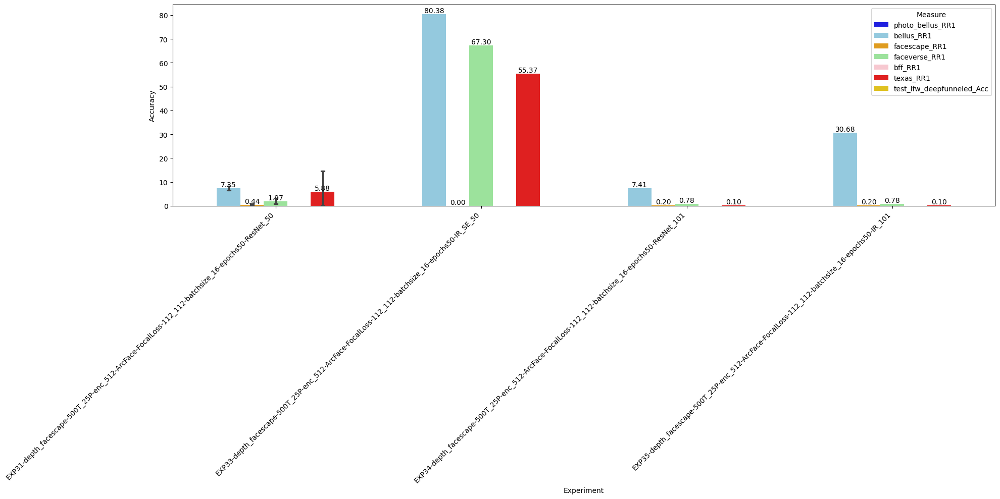

C:\Users\Eduard\AppData\Local\Temp\ipykernel_11156\4151058673.py:30: UserWarning: The palette list has more values (7) than needed (5), which may not be intended.
  ax = sns.barplot(data=df_melted, x='ml_run_experiment', y='Value', hue='Measure', errorbar=('ci', 95), capsize=0.1, palette=color_list)


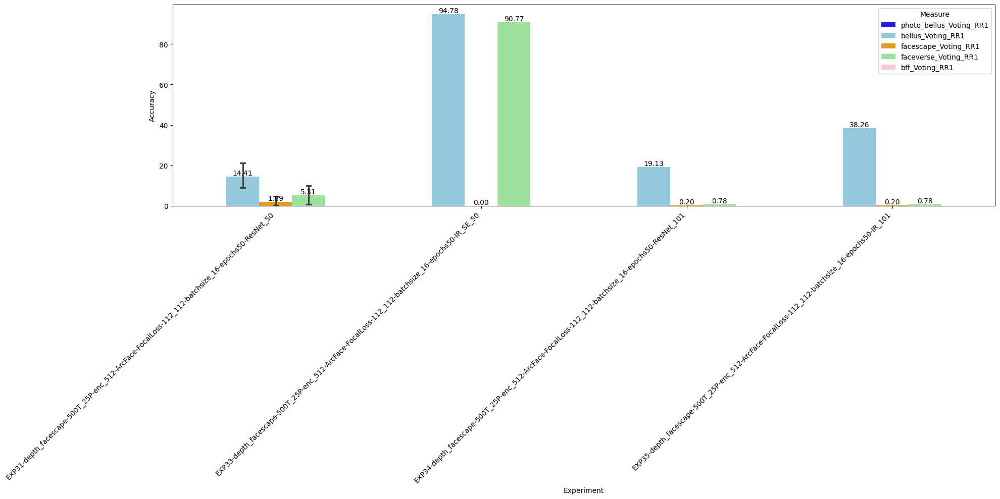

In [37]:
df_selected = select_runs(df_runs, run_configs, ['EXP31-','EXP32-','EXP33-','EXP34-','EXP35-','EXP36-'])
analyze_accuracies(df_selected, run_configs, voting=False)
analyze_accuracies(df_selected, run_configs, voting=True)

### EXP [37-42] rgb_facescape-500T_25P-enc_512-ArcFace-FocalLoss-112_112-batchsize_16-epochs50-\<MODEL\>

Selected: 6 ['191019159014369042', '291381042239090087', '310766857947861779', '326530012412376213', '728041601083563116', '776406479556832989']


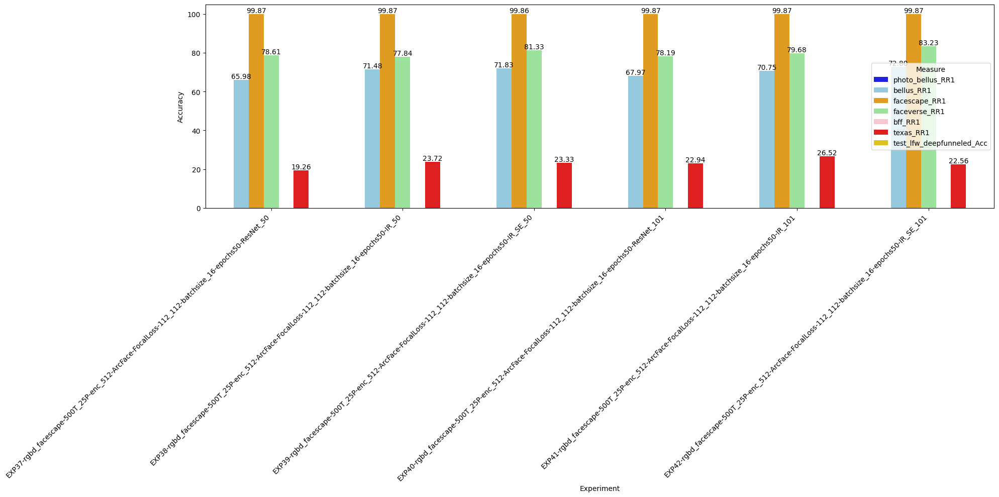

C:\Users\Eduard\AppData\Local\Temp\ipykernel_11156\4151058673.py:30: UserWarning: The palette list has more values (7) than needed (5), which may not be intended.
  ax = sns.barplot(data=df_melted, x='ml_run_experiment', y='Value', hue='Measure', errorbar=('ci', 95), capsize=0.1, palette=color_list)


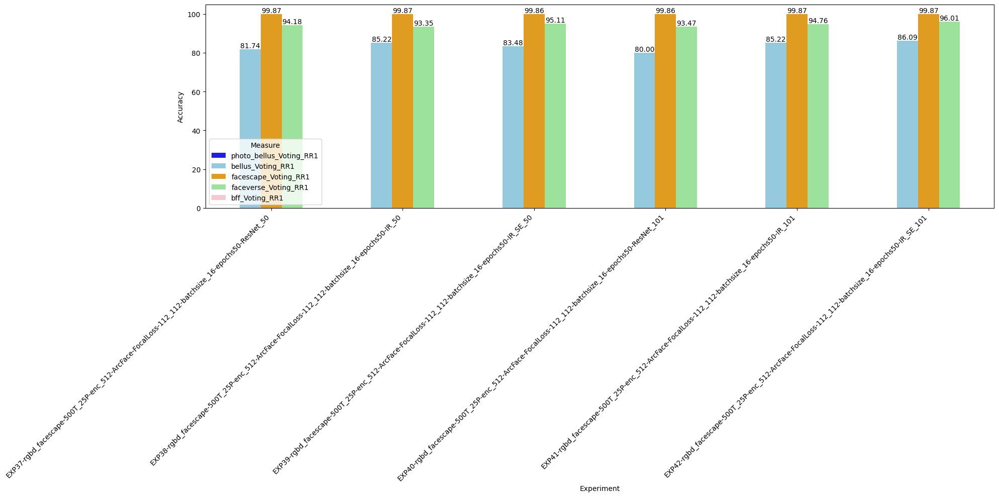

In [38]:
df_selected = select_runs(df_runs, run_configs, ['EXP37-','EXP38-','EXP39-','EXP40-','EXP41-','EXP42-'])
analyze_accuracies(df_selected, run_configs, voting=False)
analyze_accuracies(df_selected, run_configs, voting=True)

### EXP [43-48] rgbd_bellus-45T_25P-enc_512-ArcFace-FocalLoss-224_244-batchsize_16-epochs50-\<MODEL\>

Selected: 0 []


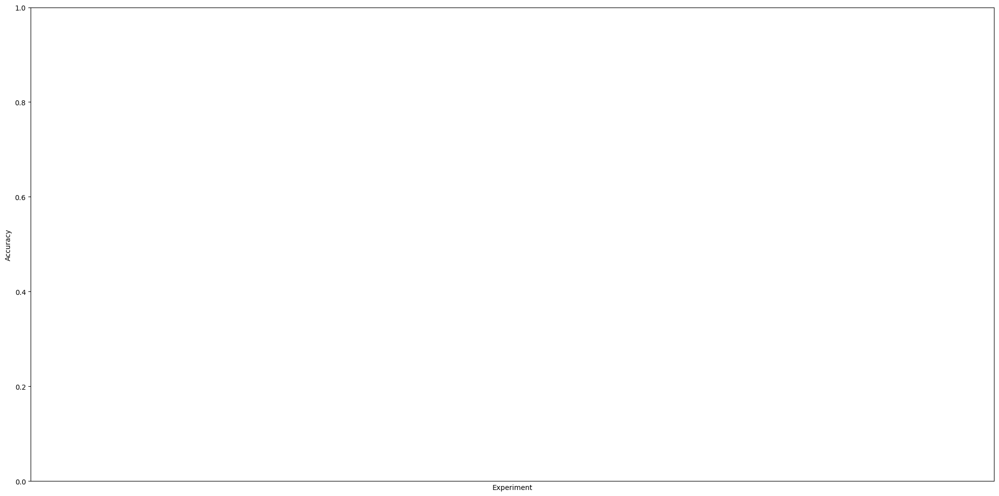

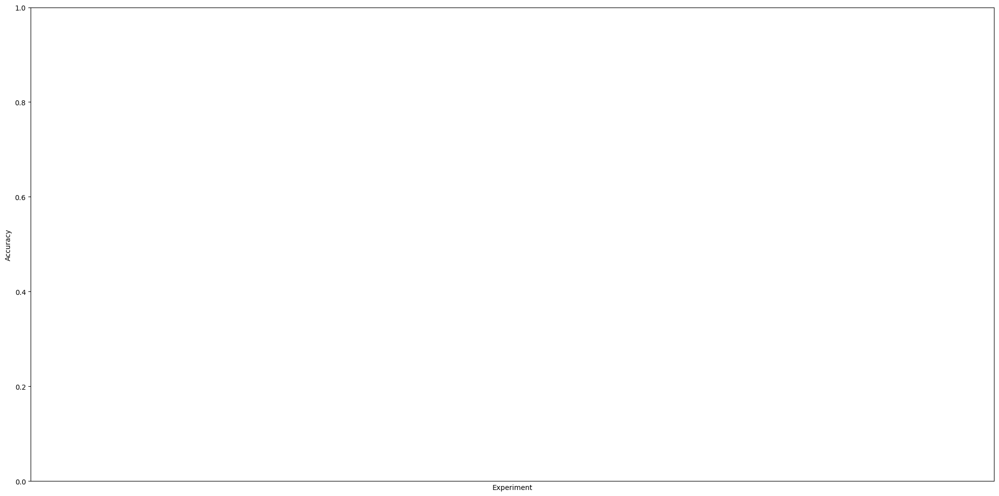

In [39]:
df_selected = select_runs(df_runs, run_configs, ['EXP43-','EXP44-','EXP45-','EXP46-','EXP47-','EXP48-'])
analyze_accuracies(df_selected, run_configs, voting=False)
analyze_accuracies(df_selected, run_configs, voting=True)

### EXP [49-51] IR-50-Pretrained on MS and AsiaPrivate

Selected: 3 ['166643670449922767', '182152522377854970', '367576227080572980']


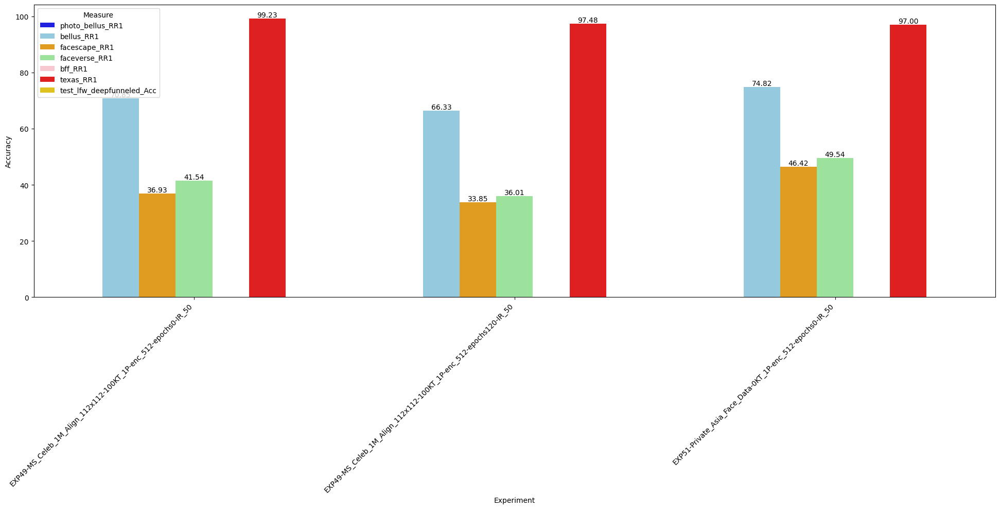

C:\Users\Eduard\AppData\Local\Temp\ipykernel_11156\4151058673.py:30: UserWarning: The palette list has more values (7) than needed (5), which may not be intended.
  ax = sns.barplot(data=df_melted, x='ml_run_experiment', y='Value', hue='Measure', errorbar=('ci', 95), capsize=0.1, palette=color_list)


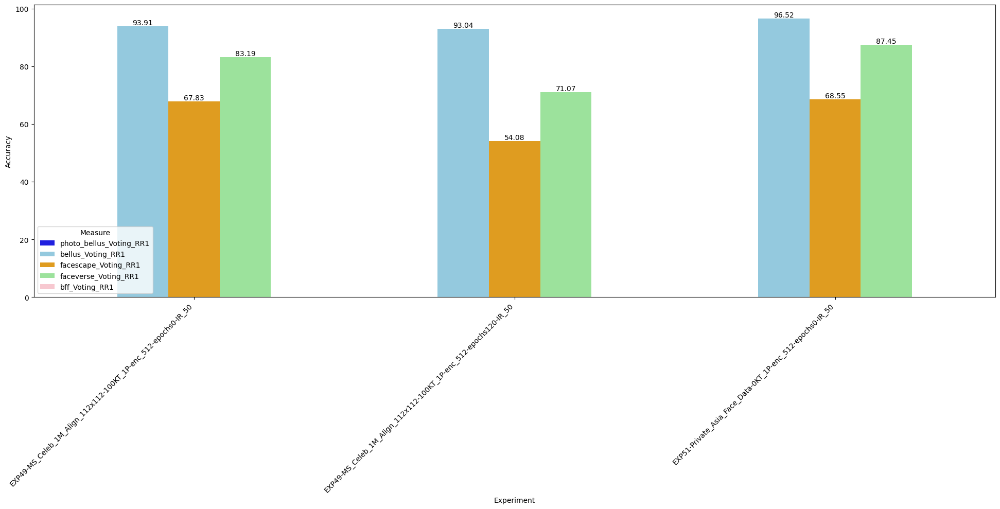

In [40]:
df_selected = select_runs(df_runs, run_configs, ['EXP49-','EXP50-','EXP51-'])
analyze_accuracies(df_selected, run_configs, voting=False)
analyze_accuracies(df_selected, run_configs, voting=True)

### EXP [54-59] rgbd_bellus-45T_25P-enc_512-ArcFace-FocalLoss-112_112-batchsize_64-epochs50-\<MODEL\>

Selected: 6 ['403606390314949540', '560752569612079448', '809419325299596291', '923224216024903713', '965364235522085669', '979873228473662894']


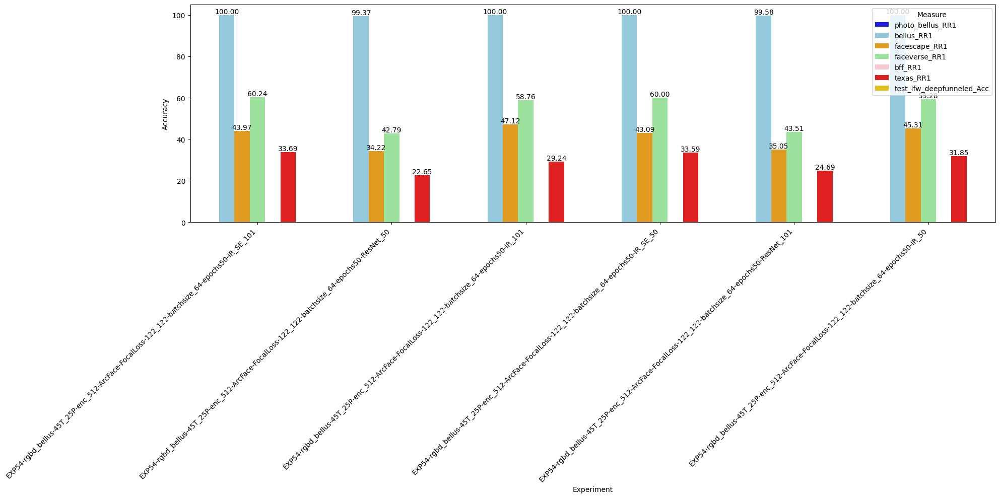

C:\Users\Eduard\AppData\Local\Temp\ipykernel_11156\4151058673.py:30: UserWarning: The palette list has more values (7) than needed (5), which may not be intended.
  ax = sns.barplot(data=df_melted, x='ml_run_experiment', y='Value', hue='Measure', errorbar=('ci', 95), capsize=0.1, palette=color_list)


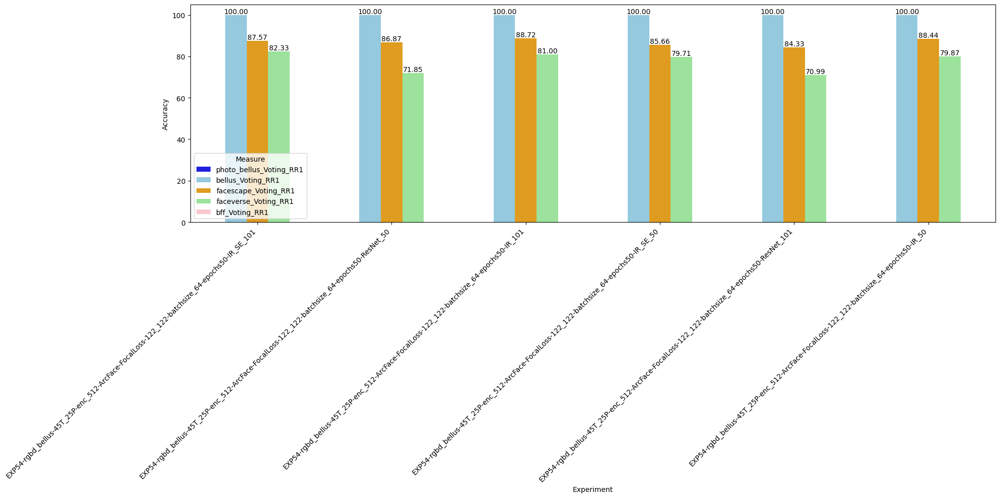

In [41]:
df_selected = select_runs(df_runs, run_configs, ['EXP54-','EXP55-','EXP56-','EXP57-','EXP58-', 'EXP59-'])
analyze_accuracies(df_selected, run_configs, voting=False)
analyze_accuracies(df_selected, run_configs, voting=True)

### EXP [13-24,54-59] rgbd_bellus-45T_25P-enc_512-ArcFace-FocalLoss-112_112-batchsize_\<16,32,64\>-epochs50-\<MODEL\>

Selected: 41 ['113129204246726823', '113129204246726823', '113129204246726823', '198001218989780979', '198001218989780979', '198001218989780979', '326301526227812475', '326301526227812475', '326301526227812475', '403606390314949540', '449428032172154329', '449428032172154329', '560752569612079448', '565141924842480235', '565141924842480235', '565141924842480235', '684526817602124812', '684526817602124812', '684526817602124812', '718201582151568174', '718201582151568174', '718201582151568174', '809419325299596291', '898263092529228606', '898263092529228606', '898263092529228606', '923224216024903713', '925354295638808217', '925354295638808217', '925354295638808217', '965364235522085669', '968146518580656468', '968146518580656468', '968146518580656468', '979873228473662894', '990636790004825293', '990636790004825293', '990636790004825293', '992720557218550828', '992720557218550828', '992720557218550828']


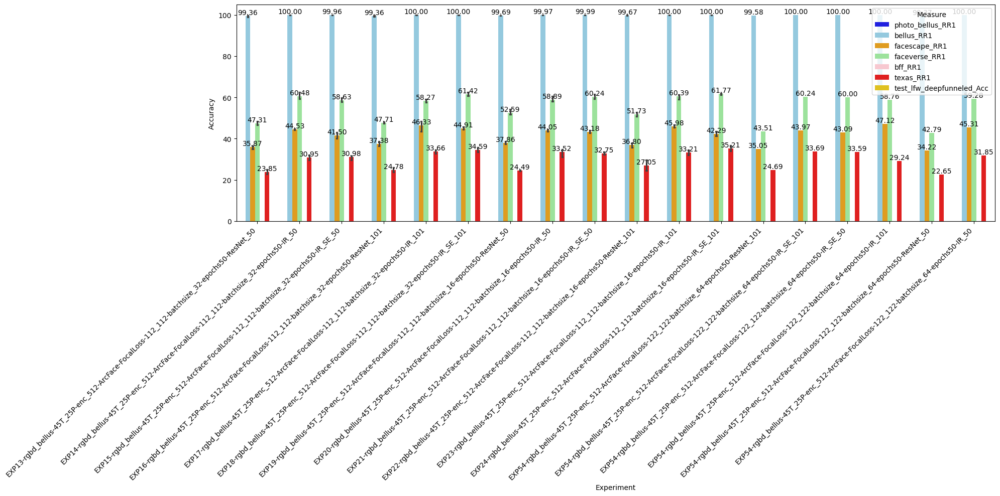

C:\Users\Eduard\AppData\Local\Temp\ipykernel_11156\4151058673.py:30: UserWarning: The palette list has more values (7) than needed (5), which may not be intended.
  ax = sns.barplot(data=df_melted, x='ml_run_experiment', y='Value', hue='Measure', errorbar=('ci', 95), capsize=0.1, palette=color_list)


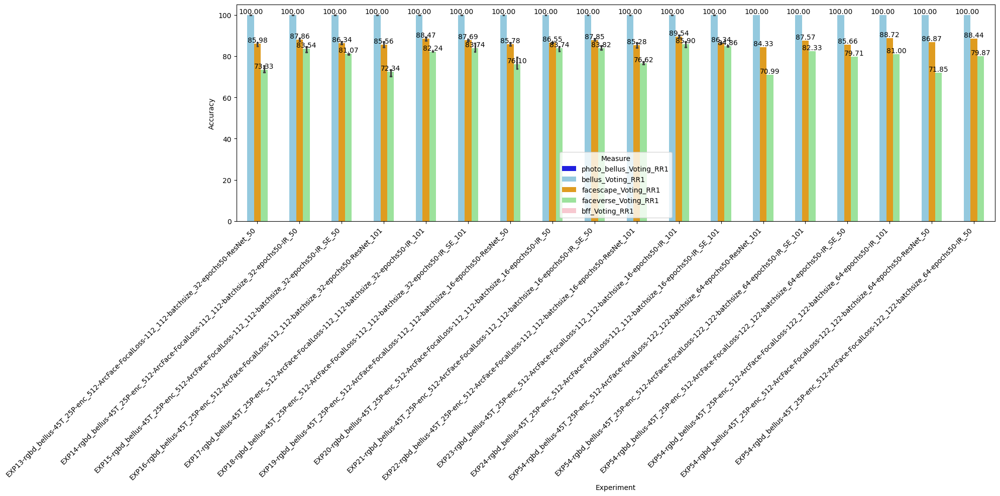

Selected: 20 ['198001218989780979', '198001218989780979', '198001218989780979', '326301526227812475', '326301526227812475', '326301526227812475', '449428032172154329', '449428032172154329', '565141924842480235', '565141924842480235', '565141924842480235', '684526817602124812', '684526817602124812', '684526817602124812', '718201582151568174', '718201582151568174', '718201582151568174', '925354295638808217', '925354295638808217', '925354295638808217']
Selected: 15 ['113129204246726823', '113129204246726823', '113129204246726823', '898263092529228606', '898263092529228606', '898263092529228606', '968146518580656468', '968146518580656468', '968146518580656468', '990636790004825293', '990636790004825293', '990636790004825293', '992720557218550828', '992720557218550828', '992720557218550828']
Selected: 6 ['403606390314949540', '560752569612079448', '809419325299596291', '923224216024903713', '965364235522085669', '979873228473662894']


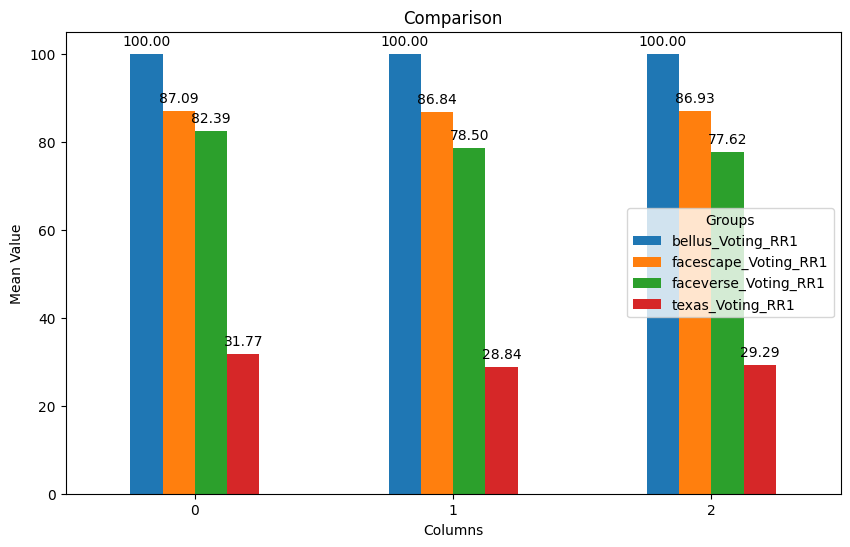

In [42]:
df_selected = select_runs(df_runs, run_configs, ['EXP13-','EXP14-','EXP15-','EXP16-','EXP17-','EXP18-', 'EXP19-','EXP20-','EXP21-','EXP22-','EXP23-','EXP24-','EXP54-','EXP55-','EXP56-','EXP57-','EXP58-', 'EXP59-'])
analyze_accuracies(df_selected, run_configs, voting=False)
analyze_accuracies(df_selected, run_configs, voting=True)

compare(df_runs, run_configs, experiments_list= [['EXP18-', 'EXP19-','EXP20-','EXP21-','EXP22-','EXP23-','EXP24-'],['EXP13-','EXP14-','EXP15-','EXP16-','EXP17-'],['EXP54-','EXP55-','EXP56-','EXP57-','EXP58-', 'EXP59-']])

### EXP [63-68] IR-50-Pretrained on MS and AsiaPrivate undistorted

Selected: 7 ['266575400434222983', '281103519597288200', '281103519597288200', '281103519597288200', '499229568889230827', '618050588810869860', '962789338795676195']


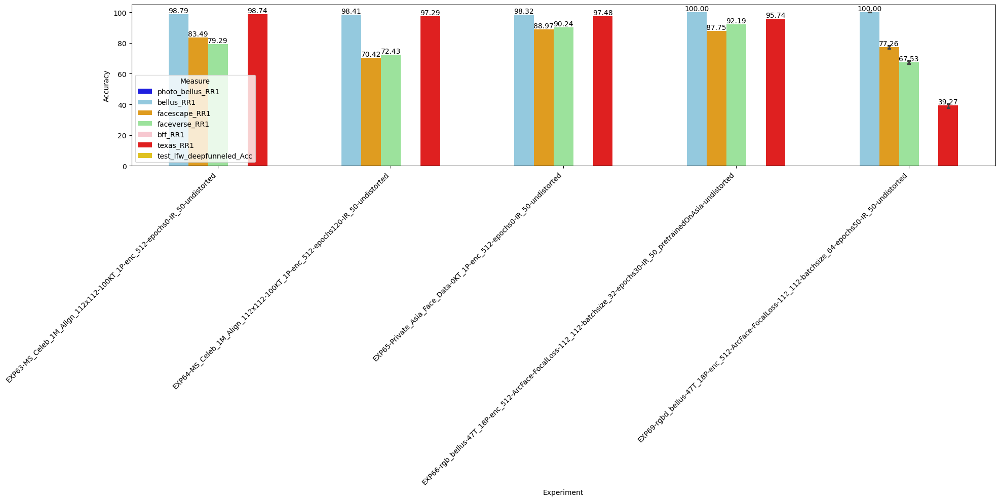

C:\Users\Eduard\AppData\Local\Temp\ipykernel_11156\4151058673.py:30: UserWarning: The palette list has more values (7) than needed (5), which may not be intended.
  ax = sns.barplot(data=df_melted, x='ml_run_experiment', y='Value', hue='Measure', errorbar=('ci', 95), capsize=0.1, palette=color_list)


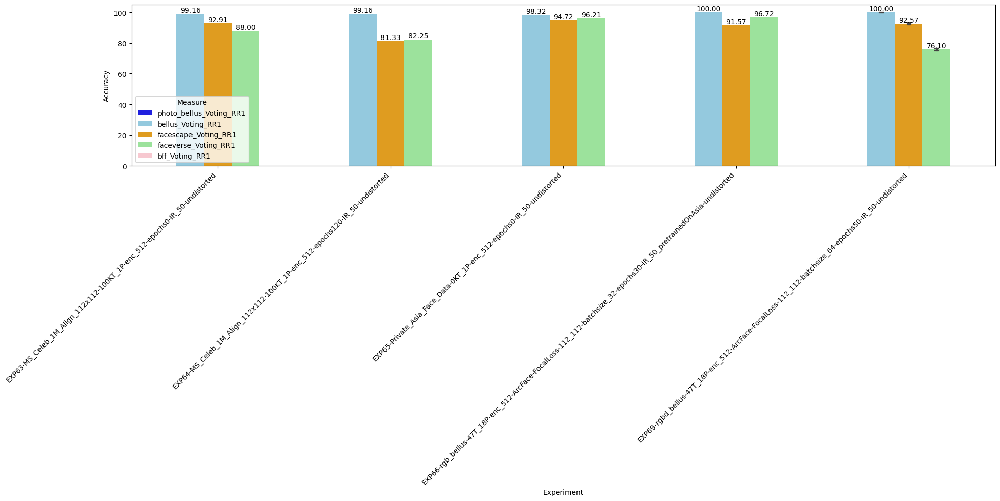

In [58]:
df_selected = select_runs(df_runs, run_configs, ['EXP63-','EXP64-','EXP65-','EXP66-', 'EXP69-'])
analyze_accuracies(df_selected, run_configs, voting=False)
analyze_accuracies(df_selected, run_configs, voting=True)

### EXP [68-77] rgbd_bellus-47T_18P-enc_512-ArcFace-FocalLoss-112_112-batchsize_\<64-128\>-epochs50-\<MODEL\>-undistored

Selected: 17 ['281103519597288200', '281103519597288200', '281103519597288200', '307141597483709347', '307141597483709347', '307141597483709347', '325978011602923062', '325978011602923062', '325978011602923062', '727389981403576407', '727389981403576407', '820543159121493007', '866632454380967756', '915686142985997258', '927749406521887388', '959777342908963461', '968007903589141954']


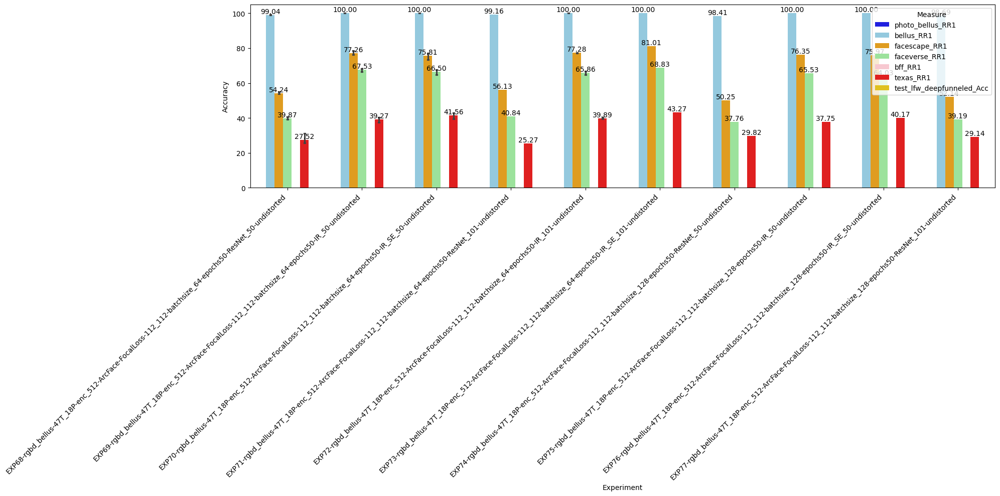

C:\Users\Eduard\AppData\Local\Temp\ipykernel_11156\4151058673.py:30: UserWarning: The palette list has more values (7) than needed (5), which may not be intended.
  ax = sns.barplot(data=df_melted, x='ml_run_experiment', y='Value', hue='Measure', errorbar=('ci', 95), capsize=0.1, palette=color_list)


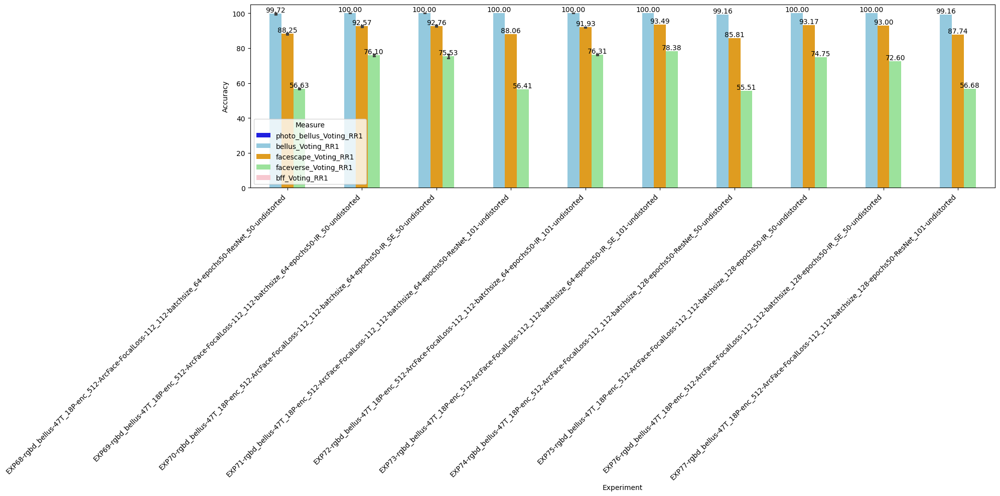

In [44]:
df_selected = select_runs(df_runs, run_configs, ['EXP68-','EXP69-','EXP70-','EXP71-','EXP72-','EXP73-','EXP74-','EXP75-','EXP76-','EXP77-','EXP78-','EXP79-'])
analyze_accuracies(df_selected, run_configs, voting=False)
analyze_accuracies(df_selected, run_configs, voting=True)

### EXP [80-91] rgbd_facescape-500T_18P-enc_512-ArcFace-FocalLoss-112_112-batchsize_\<64-128\>-epochs50-\<MODEL\>

Selected: 10 ['185702516354196711', '396886846650893300', '402761233898315468', '468163769301028247', '481893616629065103', '559801836351447107', '674007253664014996', '820603248422378959', '974592429531935907', '982988743730154599']


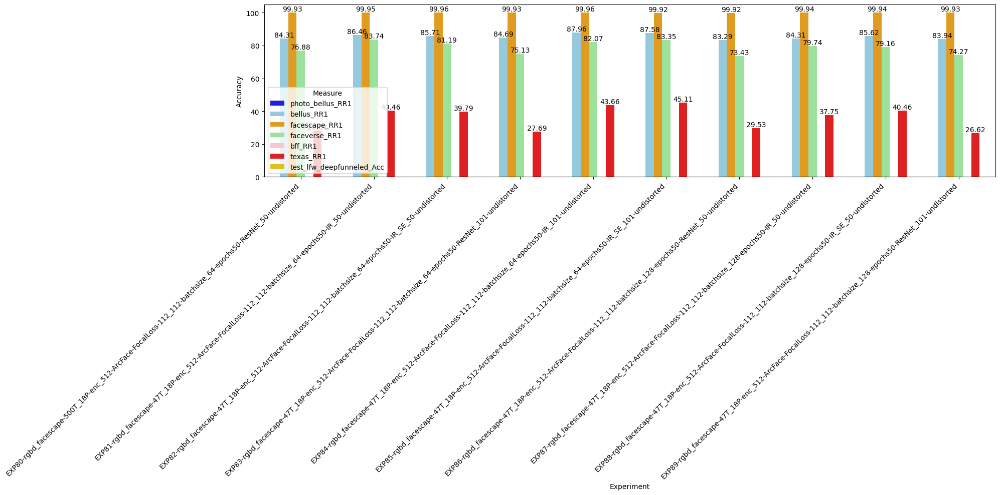

C:\Users\Eduard\AppData\Local\Temp\ipykernel_11156\4151058673.py:30: UserWarning: The palette list has more values (7) than needed (5), which may not be intended.
  ax = sns.barplot(data=df_melted, x='ml_run_experiment', y='Value', hue='Measure', errorbar=('ci', 95), capsize=0.1, palette=color_list)


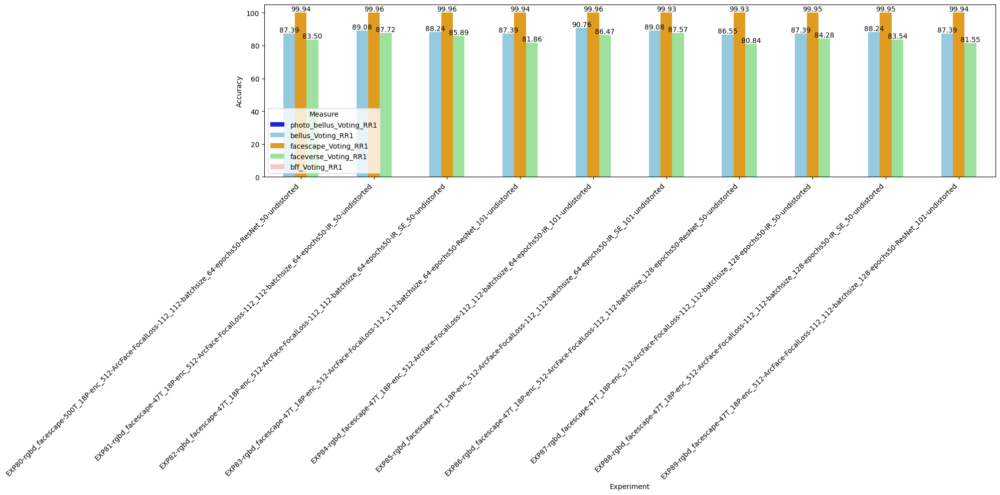

Selected: 6 ['185702516354196711', '402761233898315468', '481893616629065103', '820603248422378959', '974592429531935907', '982988743730154599']
Selected: 4 ['396886846650893300', '468163769301028247', '559801836351447107', '674007253664014996']


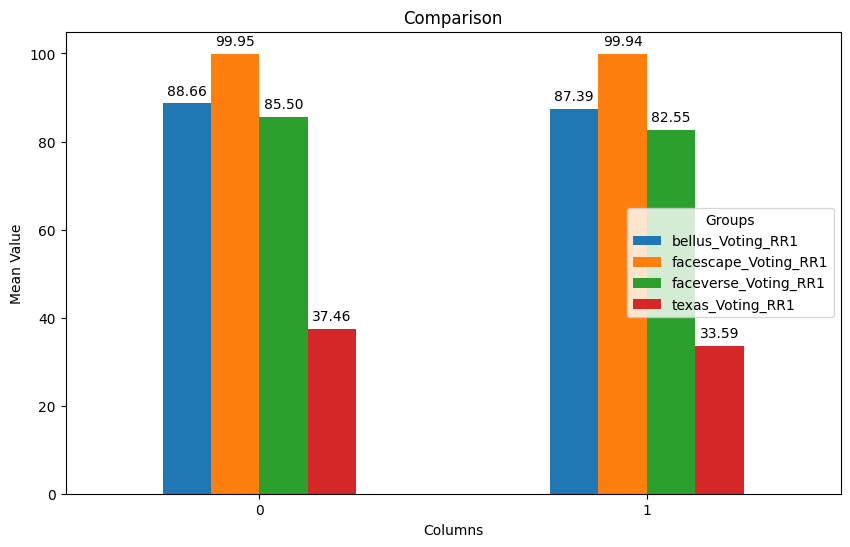

In [45]:
df_selected = select_runs(df_runs, run_configs, ['EXP80-','EXP81-','EXP82-','EXP83-','EXP84-','EXP85-','EXP86-','EXP87-','EXP88-','EXP89-','EXP90-','EXP91-'])
analyze_accuracies(df_selected, run_configs, voting=False)
analyze_accuracies(df_selected, run_configs, voting=True)

compare(df_runs, run_configs, experiments_list= [['EXP80-','EXP81-','EXP82-','EXP83-','EXP84-','EXP85-'],['EXP86-','EXP87-','EXP88-','EXP89-','EXP90-','EXP91-']])

### EXP [92-97] rgbd_bellus-47T_18P-enc_512-ArcFace-Softmax-112_112-batchsize_32-epochs50-\<MODEL\>

Selected: 21 ['335145440886650360', '335145440886650360', '335145440886650360', '459229338744775301', '459229338744775301', '459229338744775301', '559137542276808990', '559137542276808990', '559137542276808990', '667973476969906141', '667973476969906141', '667973476969906141', '667973476969906141', '667973476969906141', '667973476969906141', '694344490665473176', '694344490665473176', '694344490665473176', '991593632852636074', '991593632852636074', '991593632852636074']


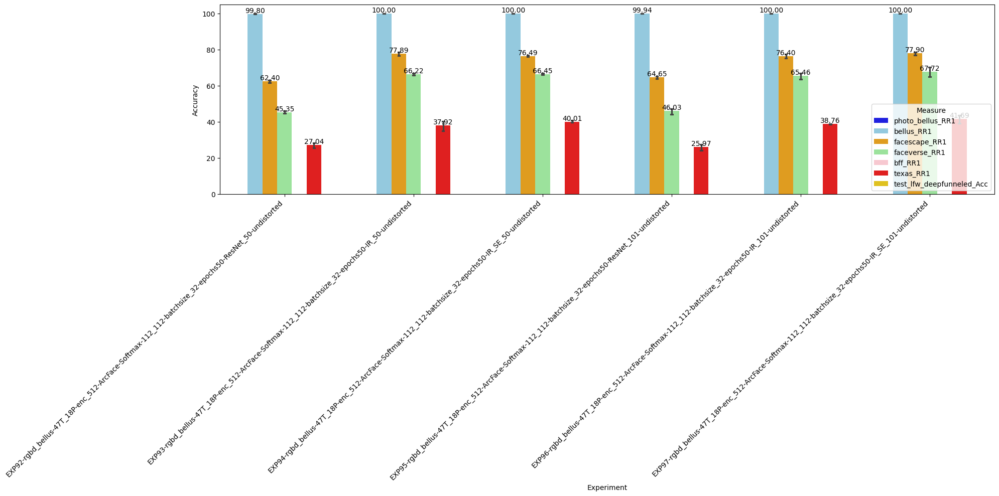

C:\Users\Eduard\AppData\Local\Temp\ipykernel_11156\4151058673.py:30: UserWarning: The palette list has more values (7) than needed (5), which may not be intended.
  ax = sns.barplot(data=df_melted, x='ml_run_experiment', y='Value', hue='Measure', errorbar=('ci', 95), capsize=0.1, palette=color_list)


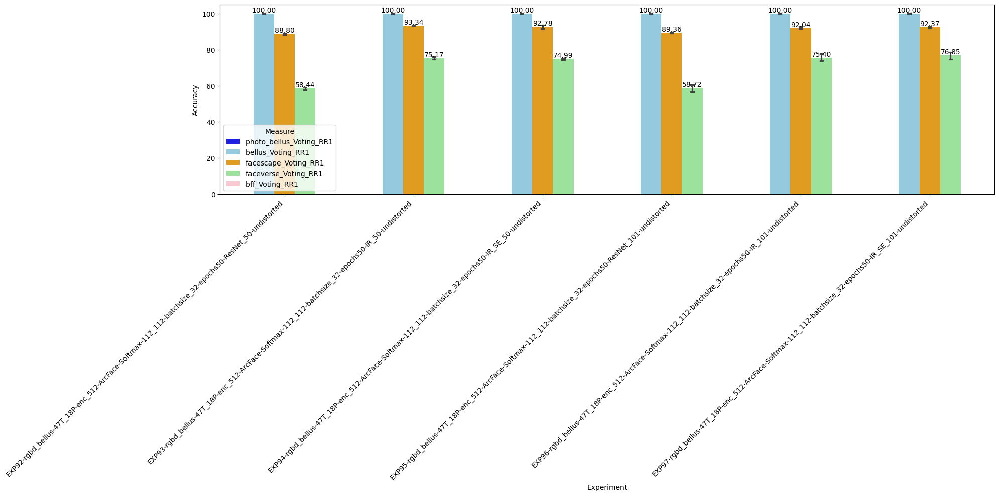

In [46]:
df_selected = select_runs(df_runs, run_configs, ['EXP92-','EXP93-','EXP94-','EXP95-','EXP96-','EXP97-'])
analyze_accuracies(df_selected, run_configs, voting=False)
analyze_accuracies(df_selected, run_configs, voting=True)

### EXP [98-102] IR-50-Pretrained on MS and AsiaPrivate undistorted

Selected: 10 ['345513842048149774', '613800305909019040', '799534553467965446', '838556559081507261', '838556559081507261', '838556559081507261', '959635273981550305', '959635273981550305', '959635273981550305', '959635273981550305']


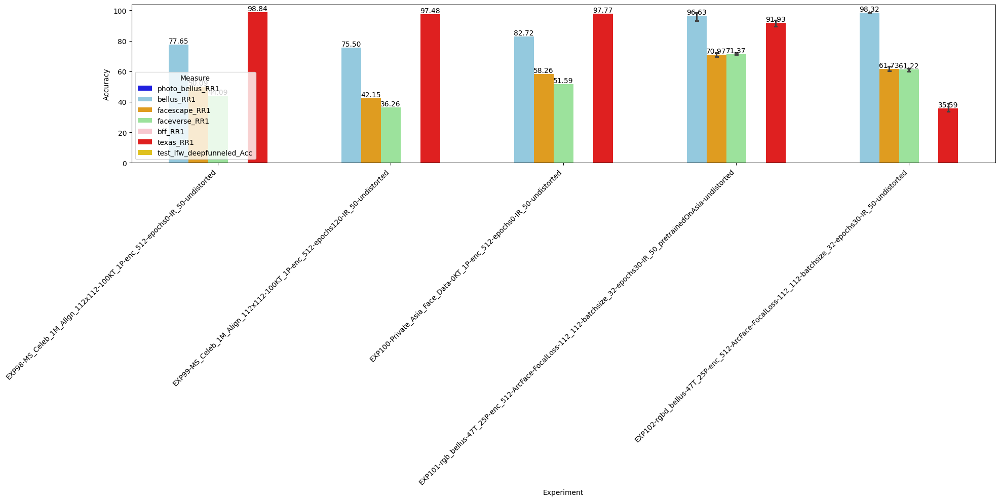

C:\Users\Eduard\AppData\Local\Temp\ipykernel_11156\4151058673.py:30: UserWarning: The palette list has more values (7) than needed (5), which may not be intended.
  ax = sns.barplot(data=df_melted, x='ml_run_experiment', y='Value', hue='Measure', errorbar=('ci', 95), capsize=0.1, palette=color_list)


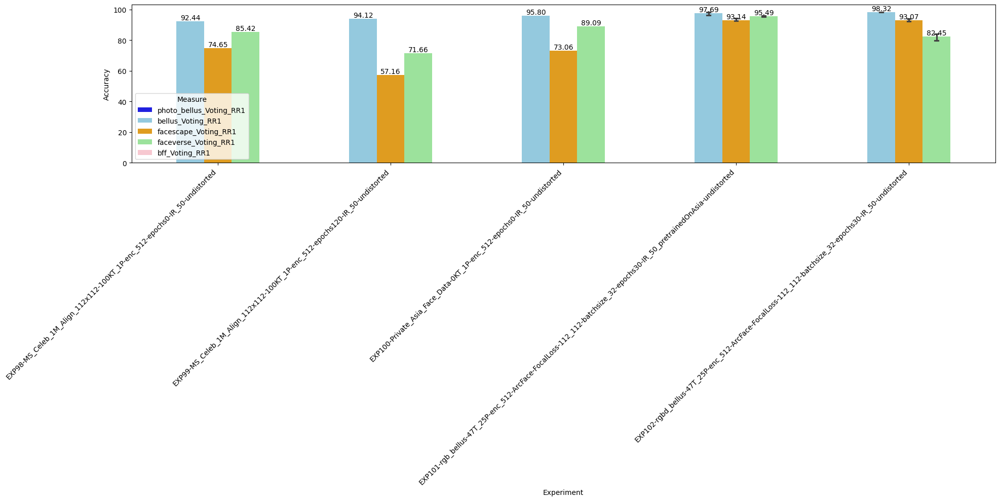

In [47]:
df_selected = select_runs(df_runs, run_configs, ['EXP98-','EXP99-','EXP100-','EXP101-','EXP102-'])
analyze_accuracies(df_selected, run_configs, voting=False)
analyze_accuracies(df_selected, run_configs, voting=True)

### EXP [103-108] rgbd_bellus-47T_25P-enc_512-ArcFace-FocalLoss-112_112-batchsize_64-epochs50-\<MODEL\>-undistored

Selected: 15 ['151200187947060709', '221025528899696745', '221025528899696745', '221025528899696745', '371879459315946466', '371879459315946466', '371879459315946466', '862796972591887133', '862796972591887133', '862796972591887133', '873117376202587585', '873117376202587585', '873117376202587585', '993599159149121347', '993599159149121347']


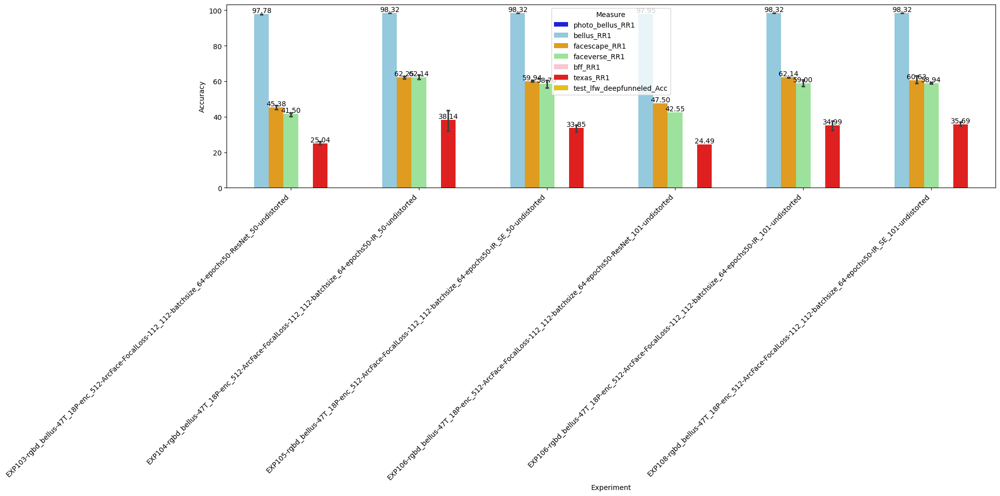

C:\Users\Eduard\AppData\Local\Temp\ipykernel_11156\4151058673.py:30: UserWarning: The palette list has more values (7) than needed (5), which may not be intended.
  ax = sns.barplot(data=df_melted, x='ml_run_experiment', y='Value', hue='Measure', errorbar=('ci', 95), capsize=0.1, palette=color_list)


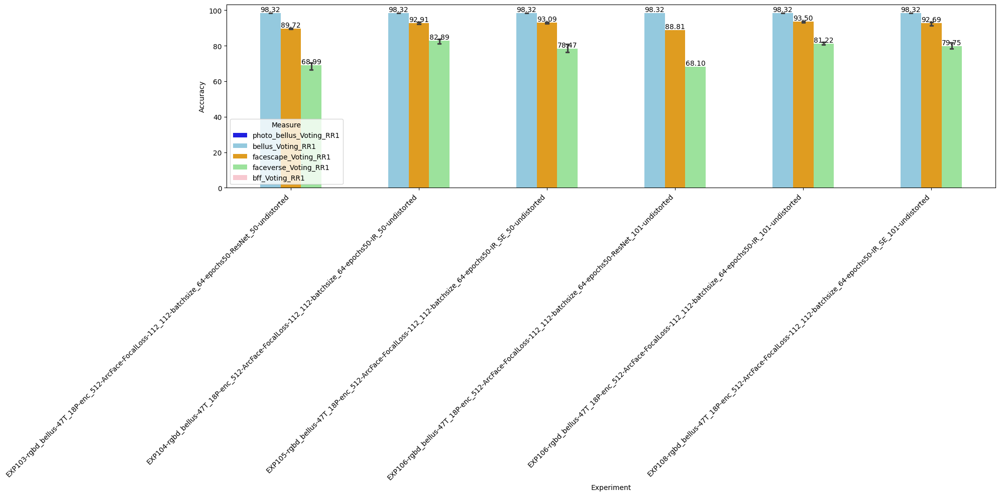

In [48]:
df_selected = select_runs(df_runs, run_configs, ['EXP103-','EXP104-','EXP105-','EXP106-','EXP107-','EXP108-'])
analyze_accuracies(df_selected, run_configs, voting=False)
analyze_accuracies(df_selected, run_configs, voting=True)

### EXP [69-73,103-108] rgbd_bellus-47T_\<18-25P\>-enc_512-ArcFace-FocalLoss-112_112-batchsize_64-epochs50-\<MODEL\>-undistored

Selected: 25 ['151200187947060709', '221025528899696745', '221025528899696745', '221025528899696745', '281103519597288200', '281103519597288200', '281103519597288200', '307141597483709347', '307141597483709347', '307141597483709347', '371879459315946466', '371879459315946466', '371879459315946466', '727389981403576407', '727389981403576407', '820543159121493007', '862796972591887133', '862796972591887133', '862796972591887133', '873117376202587585', '873117376202587585', '873117376202587585', '927749406521887388', '993599159149121347', '993599159149121347']


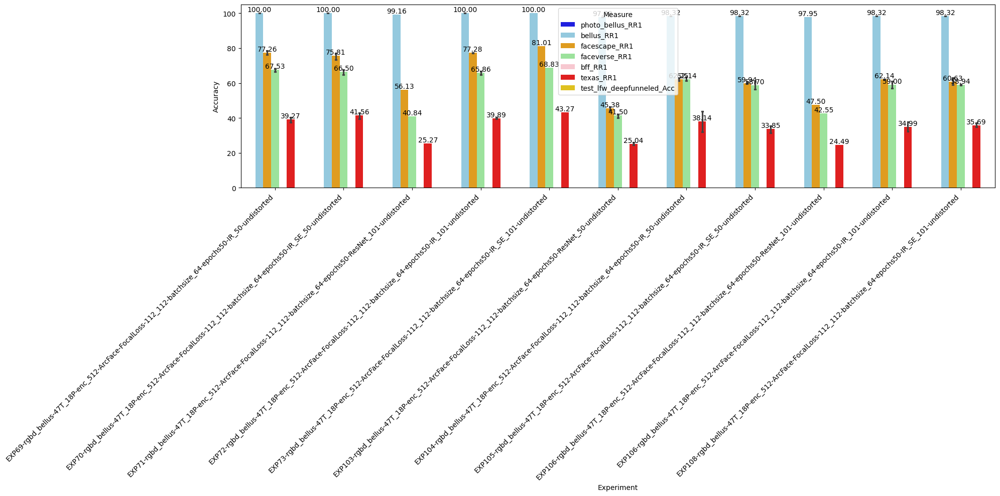

C:\Users\Eduard\AppData\Local\Temp\ipykernel_11156\4151058673.py:30: UserWarning: The palette list has more values (7) than needed (5), which may not be intended.
  ax = sns.barplot(data=df_melted, x='ml_run_experiment', y='Value', hue='Measure', errorbar=('ci', 95), capsize=0.1, palette=color_list)


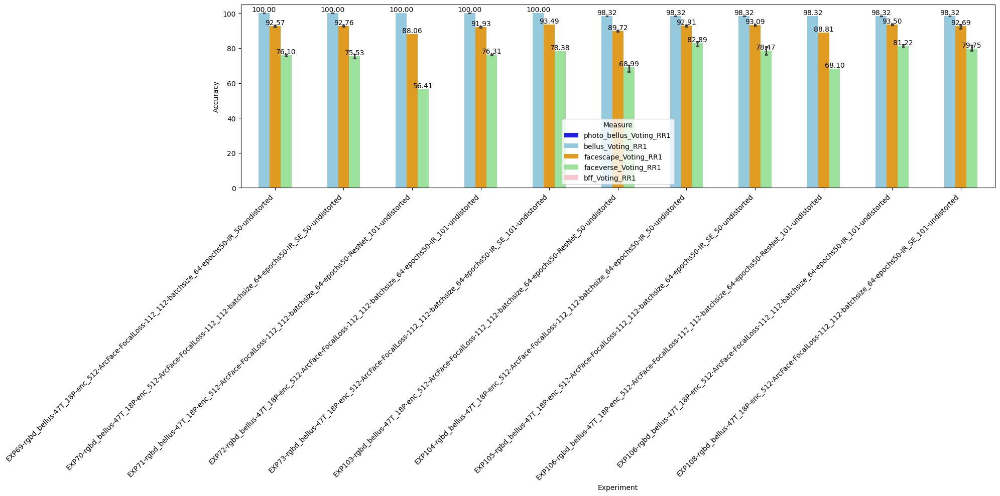

Selected: 10 ['281103519597288200', '281103519597288200', '281103519597288200', '307141597483709347', '307141597483709347', '307141597483709347', '727389981403576407', '727389981403576407', '820543159121493007', '927749406521887388']
Selected: 15 ['151200187947060709', '221025528899696745', '221025528899696745', '221025528899696745', '371879459315946466', '371879459315946466', '371879459315946466', '862796972591887133', '862796972591887133', '862796972591887133', '873117376202587585', '873117376202587585', '873117376202587585', '993599159149121347', '993599159149121347']


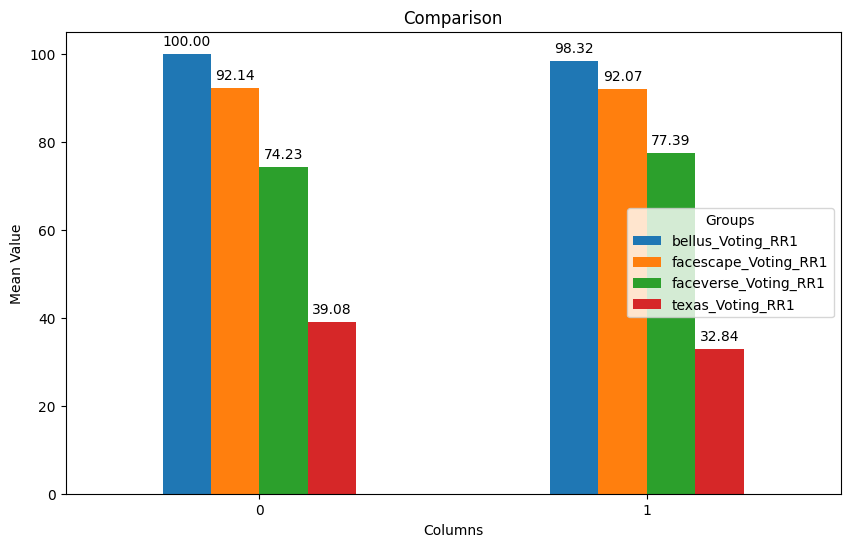

In [49]:
df_selected = select_runs(df_runs, run_configs, ['EXP69-','EXP70-','EXP71-','EXP72-','EXP73-','EXP103-','EXP104-','EXP105-','EXP106-','EXP107-','EXP108-'])
analyze_accuracies(df_selected, run_configs, voting=False)
analyze_accuracies(df_selected, run_configs, voting=True)


compare(df_runs, run_configs, experiments_list= [['EXP69-','EXP70-','EXP71-','EXP72-','EXP73-'],['EXP103-','EXP104-','EXP105-','EXP106-','EXP107-','EXP108-']])

### EXP [109-114] rgbd_facescape-500T_25P-enc_512-ArcFace-FocalLoss-112_112-batchsize_64-epochs50-\<MODEL\>-undistored

Selected: 12 ['113036838634980117', '113036838634980117', '113036838634980117', '655055435312436450', '655055435312436450', '655055435312436450', '669357620708418267', '669357620708418267', '669357620708418267', '835169790375351776', '835169790375351776', '835169790375351776']


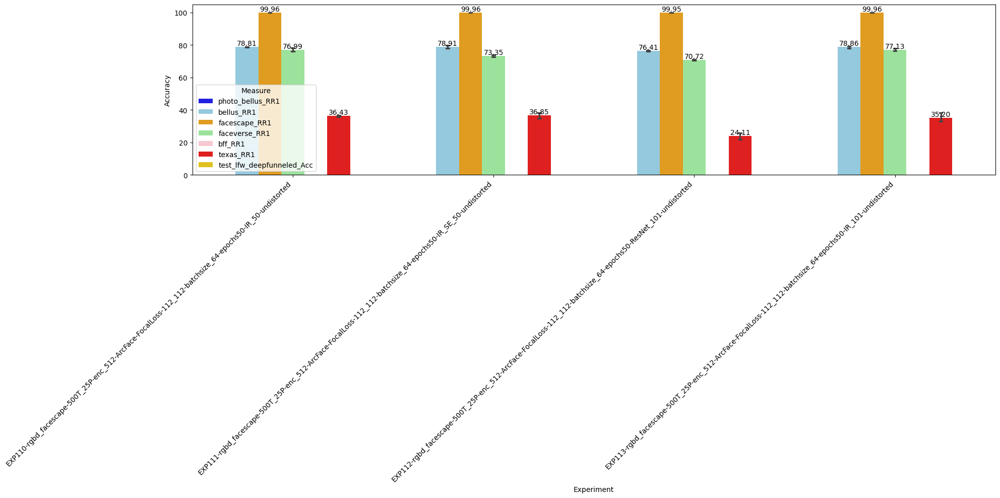

C:\Users\Eduard\AppData\Local\Temp\ipykernel_11156\4151058673.py:30: UserWarning: The palette list has more values (7) than needed (5), which may not be intended.
  ax = sns.barplot(data=df_melted, x='ml_run_experiment', y='Value', hue='Measure', errorbar=('ci', 95), capsize=0.1, palette=color_list)


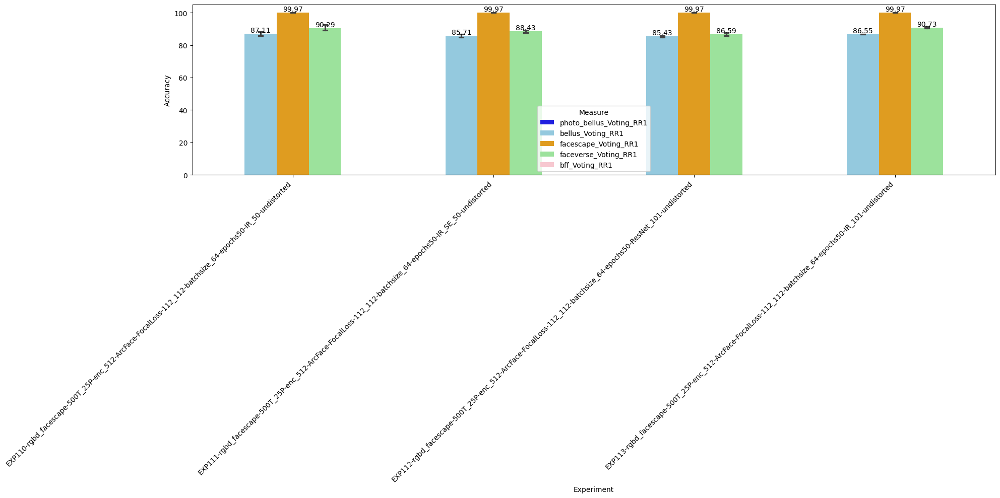

In [50]:
df_selected = select_runs(df_runs, run_configs, ['EXP109-','EXP110-','EXP111-','EXP112-','EXP113-','EXP114-'])
analyze_accuracies(df_selected, run_configs, voting=False)
analyze_accuracies(df_selected, run_configs, voting=True)

### EXP [80-85,109-114] rgbd_facescape-500T_\<18,25P\>-enc_512-ArcFace-FocalLoss-112_112-batchsize_64-epochs50-\<MODEL\>-undistored

Selected: 18 ['113036838634980117', '113036838634980117', '113036838634980117', '185702516354196711', '402761233898315468', '481893616629065103', '655055435312436450', '655055435312436450', '655055435312436450', '669357620708418267', '669357620708418267', '669357620708418267', '820603248422378959', '835169790375351776', '835169790375351776', '835169790375351776', '974592429531935907', '982988743730154599']


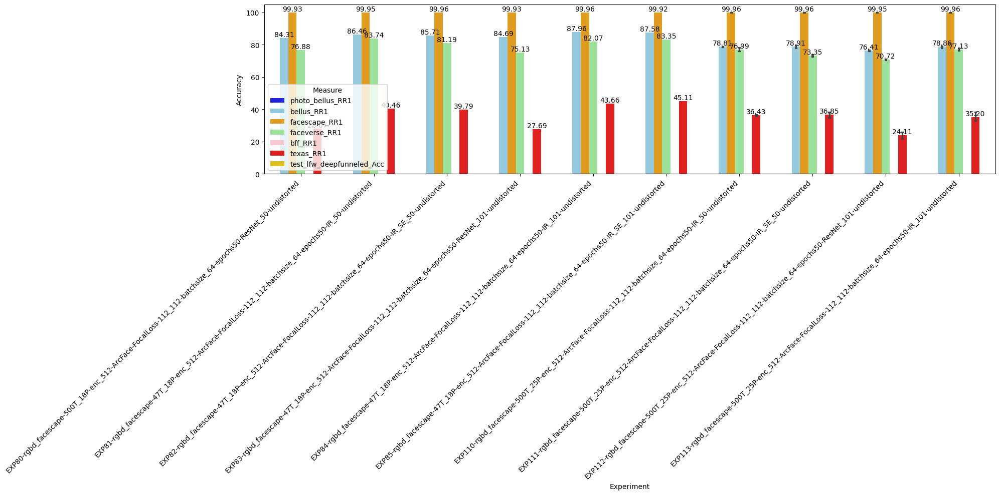

C:\Users\Eduard\AppData\Local\Temp\ipykernel_11156\4151058673.py:30: UserWarning: The palette list has more values (7) than needed (5), which may not be intended.
  ax = sns.barplot(data=df_melted, x='ml_run_experiment', y='Value', hue='Measure', errorbar=('ci', 95), capsize=0.1, palette=color_list)


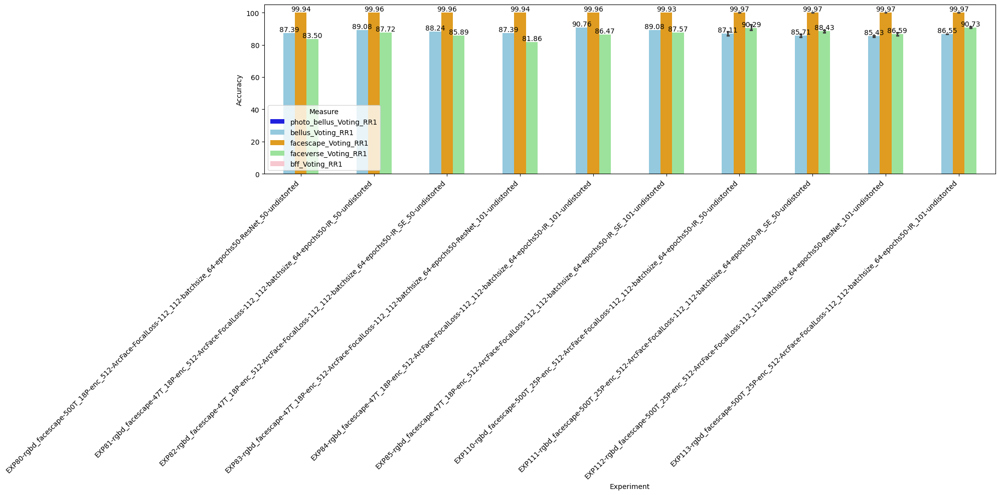

Selected: 6 ['185702516354196711', '402761233898315468', '481893616629065103', '820603248422378959', '974592429531935907', '982988743730154599']
Selected: 12 ['113036838634980117', '113036838634980117', '113036838634980117', '655055435312436450', '655055435312436450', '655055435312436450', '669357620708418267', '669357620708418267', '669357620708418267', '835169790375351776', '835169790375351776', '835169790375351776']


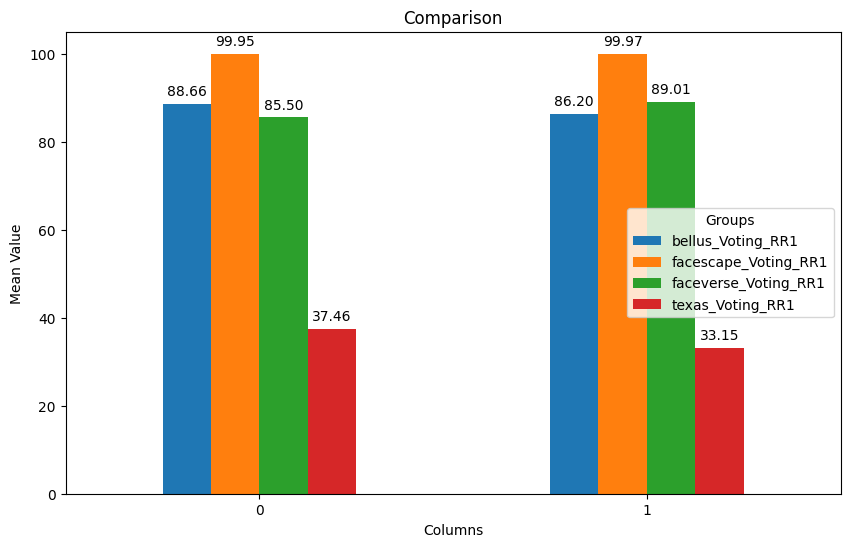

In [51]:
df_selected = select_runs(df_runs, run_configs, ['EXP80-','EXP81-','EXP82-','EXP83-','EXP84-','EXP85-','EXP109-','EXP110-','EXP111-','EXP112-','EXP113-','EXP114-'])
analyze_accuracies(df_selected, run_configs, voting=False)
analyze_accuracies(df_selected, run_configs, voting=True)


compare(df_runs, run_configs, experiments_list= [['EXP80-','EXP81-','EXP82-','EXP83-','EXP84-','EXP85-'],['EXP109-','EXP110-','EXP111-','EXP112-','EXP113-','EXP114-']])

### EXP [119-120+131] rgb_monoffhq\<+rgb_bellus\>-\<1000T, 2000T, 4000T\>_25P-enc_512-ArcFace-FocalLoss-112_112-batchsize_64-epochs50-\<MODEL\>-undistored

Selected: 9 ['397920014231035476', '397920014231035476', '397920014231035476', '877128359593637065', '877128359593637065', '877128359593637065', '971096871941012334', '971096871941012334', '971096871941012334']


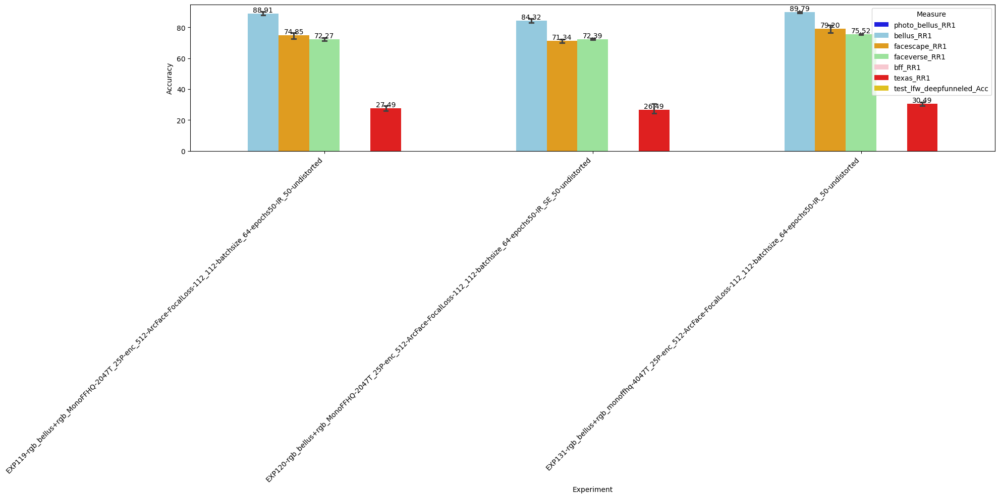

C:\Users\Eduard\AppData\Local\Temp\ipykernel_11156\4151058673.py:30: UserWarning: The palette list has more values (7) than needed (5), which may not be intended.
  ax = sns.barplot(data=df_melted, x='ml_run_experiment', y='Value', hue='Measure', errorbar=('ci', 95), capsize=0.1, palette=color_list)


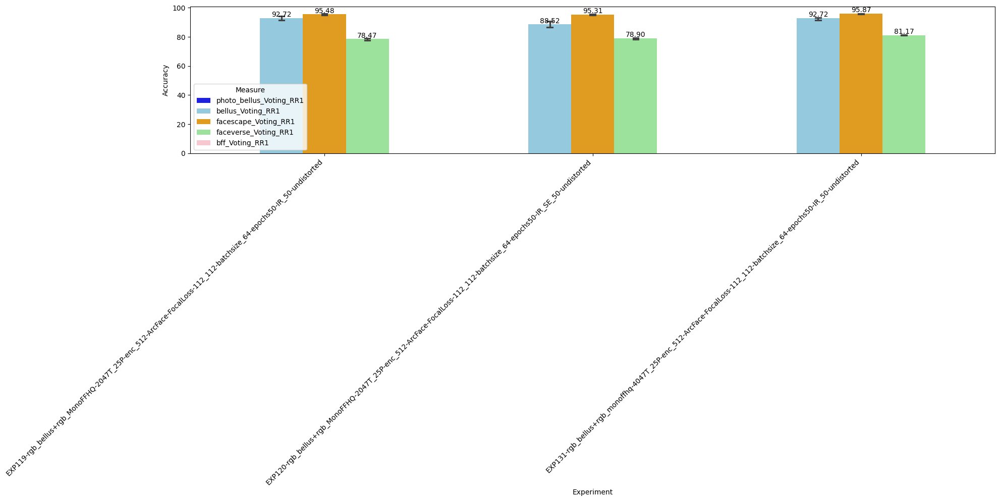

In [52]:
df_selected = select_runs(df_runs, run_configs, ['EXP119-','EXP120-','EXP131-'])
analyze_accuracies(df_selected, run_configs, voting=False)
analyze_accuracies(df_selected, run_configs, voting=True)

### EXP [115+117+130+138+140+142+144+146+148] rgb_monoffhq-\<1000T, 2000T, 4000T, 8000T, 12000T, 16000T, 32000T, 48000T, 70000T\>_25P-enc_512-ArcFace-FocalLoss-112_112-batchsize_64-epochs50-IR_50-undistored

http://127.0.0.1:8080/#/compare-experiments/s?experiments=%5B%22371455595809564792%22%2C%22486073039784939573%22%2C%22620872212176561243%22%2C%22628382155246511118%22%2C%22871200489565496553%22%5D&searchFilter=&orderByKey=attributes.start_time&orderByAsc=false&startTime=ALL&lifecycleFilter=Active&modelVersionFilter=All+Runs&datasetsFilter=W10%3D&compareRunsMode=CHART

Selected: 36 ['189369814744956385', '189369814744956385', '189369814744956385', '189369814744956385', '245527520330649458', '245527520330649458', '245527520330649458', '245527520330649458', '256041661064468171', '256041661064468171', '256041661064468171', '256041661064468171', '256041661064468171', '256041661064468171', '371455595809564792', '371455595809564792', '371455595809564792', '371455595809564792', '371455595809564792', '371455595809564792', '486073039784939573', '486073039784939573', '486073039784939573', '620872212176561243', '620872212176561243', '620872212176561243', '628382155246511118', '628382155246511118', '628382155246511118', '628382155246511118', '628382155246511118', '628382155246511118', '813870293221927320', '871200489565496553', '871200489565496553', '871200489565496553']


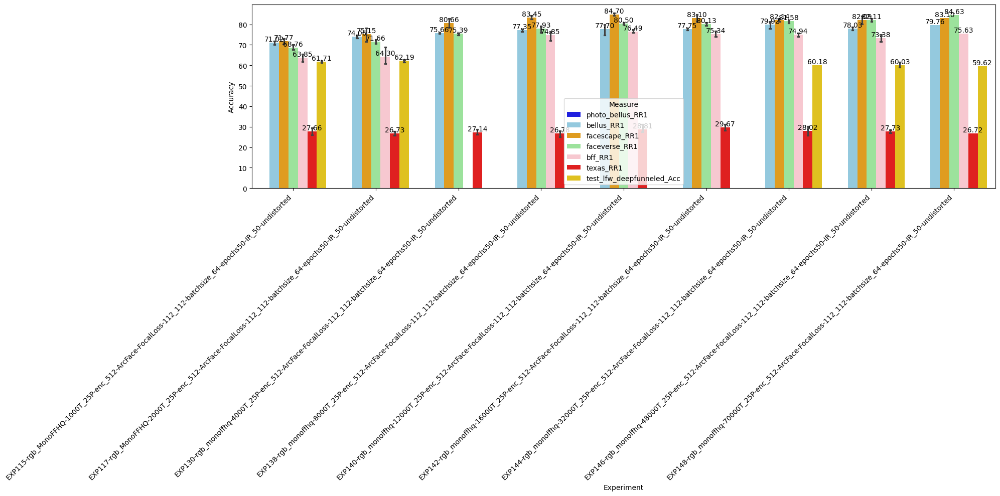

C:\Users\Eduard\AppData\Local\Temp\ipykernel_11156\4151058673.py:30: UserWarning: The palette list has more values (7) than needed (5), which may not be intended.
  ax = sns.barplot(data=df_melted, x='ml_run_experiment', y='Value', hue='Measure', errorbar=('ci', 95), capsize=0.1, palette=color_list)


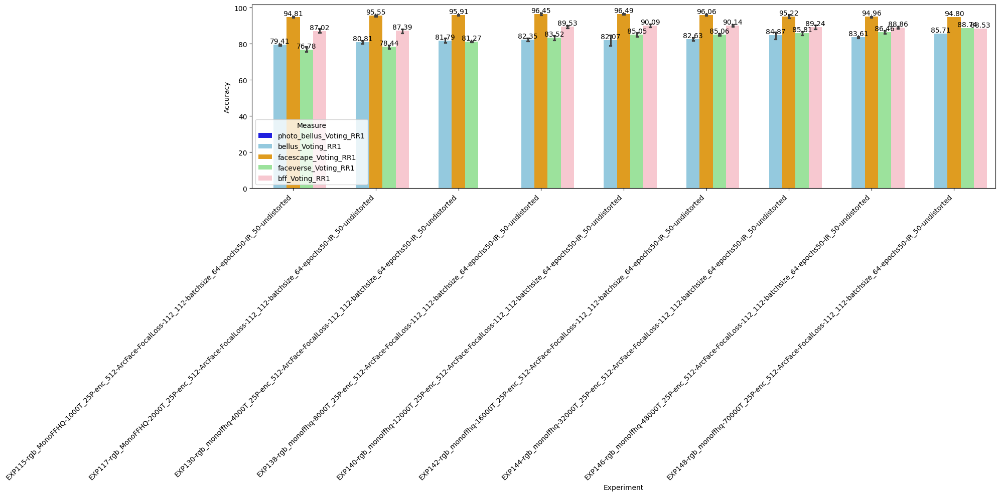

In [81]:
df_selected = select_runs(df_runs, run_configs, ['EXP115-','EXP117-','EXP130-','EXP138-','EXP140-','EXP142-','EXP144-','EXP146-','EXP148-'])
analyze_accuracies(df_selected, run_configs, voting=False)
analyze_accuracies(df_selected, run_configs, voting=True)

### EXP [121+139+141+143+145+147+149] rgbd_monoffhq-\<1000T, 2000T, 4000T, 8000T, 12000T, 16000T, 32000T, 48000T, 70000T\>_25P-enc_512-ArcFace-FocalLoss-112_112-batchsize_64-epochs50-\<MODEL\>-undistored

Selected: 20 ['113906442991919650', '113906442991919650', '113906442991919650', '147337075738313401', '147337075738313401', '147337075738313401', '657103608042998667', '657103608042998667', '657103608042998667', '657103608042998667', '657103608042998667', '730907920349415096', '730907920349415096', '730907920349415096', '900446035162718481', '900446035162718481', '900446035162718481', '973803674246006353', '973803674246006353', '973803674246006353']


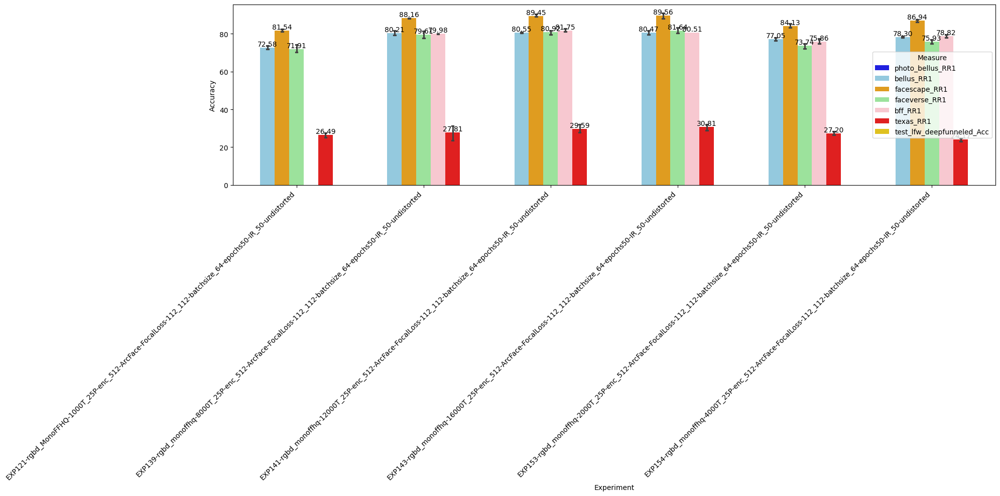

C:\Users\Eduard\AppData\Local\Temp\ipykernel_11156\4151058673.py:30: UserWarning: The palette list has more values (7) than needed (5), which may not be intended.
  ax = sns.barplot(data=df_melted, x='ml_run_experiment', y='Value', hue='Measure', errorbar=('ci', 95), capsize=0.1, palette=color_list)


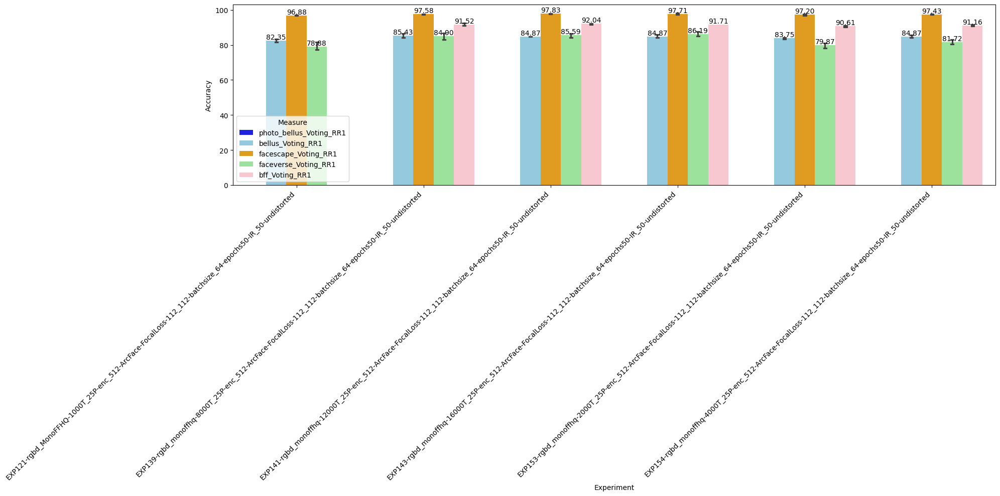

In [104]:
df_selected = select_runs(df_runs, run_configs, ['EXP121-', 'EXP153-', 'EXP154-','EXP139-','EXP141-','EXP143-','EXP145-','EXP147-','EXP149-'])
analyze_accuracies(df_selected, run_configs, voting=False)
analyze_accuracies(df_selected, run_configs, voting=True)

### EXP [123,125,127,128,132-137] photos_ffhq-\<1000T, 2000T, 4000T, 8000T, 16000T, 32000T,70000T\>_25P-enc_512-ArcFace-FocalLoss-112_112-batchsize_64-epochs150-\<IR_50, IR_SE_50\>-undistored

Selected: 40 ['101451452033972361', '101451452033972361', '101451452033972361', '101451452033972361', '101451452033972361', '101451452033972361', '263326216674076940', '263326216674076940', '263326216674076940', '263326216674076940', '263326216674076940', '263326216674076940', '343009854216248068', '343009854216248068', '343009854216248068', '343009854216248068', '343009854216248068', '460746317349380556', '460746317349380556', '460746317349380556', '460746317349380556', '460746317349380556', '460746317349380556', '675509366355141622', '675509366355141622', '675509366355141622', '675509366355141622', '675509366355141622', '675509366355141622', '675509366355141622', '716871459087049857', '716871459087049857', '716871459087049857', '716871459087049857', '716871459087049857', '716871459087049857', '815681158743906243', '815681158743906243', '815681158743906243', '815681158743906243']


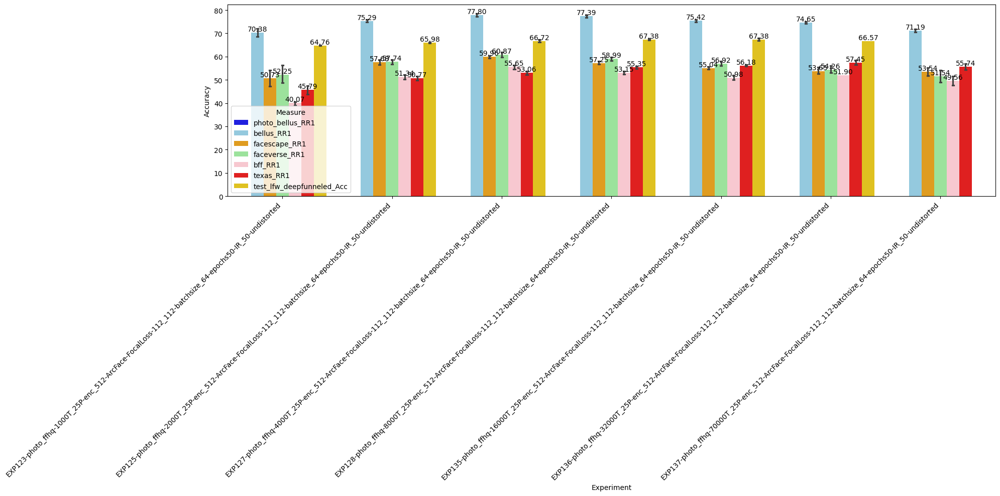

C:\Users\Eduard\AppData\Local\Temp\ipykernel_11156\4151058673.py:30: UserWarning: The palette list has more values (7) than needed (5), which may not be intended.
  ax = sns.barplot(data=df_melted, x='ml_run_experiment', y='Value', hue='Measure', errorbar=('ci', 95), capsize=0.1, palette=color_list)


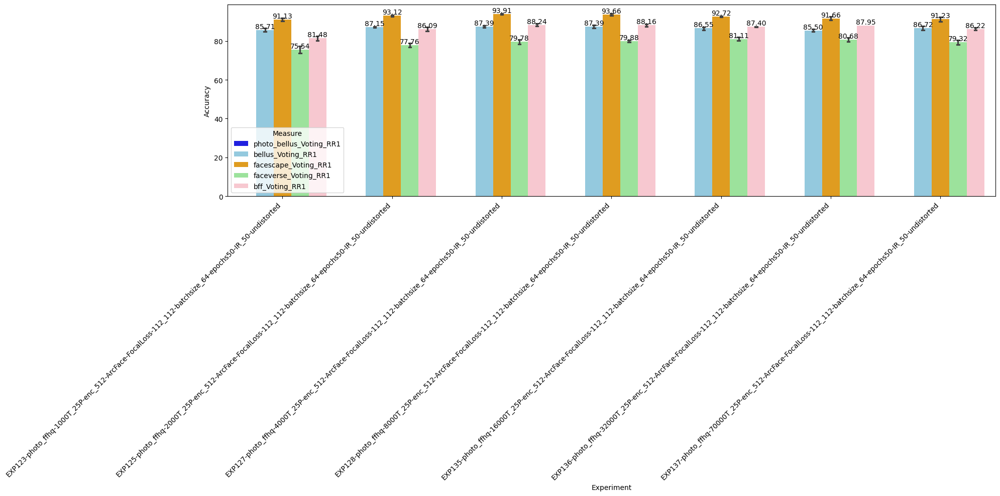

In [55]:
df_selected = select_runs(df_runs, run_configs, ['EXP123-','EXP125-','EXP127-','EXP128-','EXP135-','EXP136-','EXP137-'])
analyze_accuracies(df_selected, run_configs, voting=False)
analyze_accuracies(df_selected, run_configs, voting=True)

### EXP [142, 155, 156] rgb_monoffhq-16000T_25P-enc_512-ArcFace-FocalLoss-112_112-batchsize_\<64, 124, 256, 512, XXX\>-epochs50-\<IR_50, IR_SE_50\>-undistored

ANMERKUNG: 155, 156 nicht bis zum Ende trainiert daher bff schlechter : http://127.0.0.1:8080/#/compare-experiments/s?experiments=%5B%22197763542945012616%22%2C%22256041661064468171%22%2C%22372697409431595964%22%5D&searchFilter=&orderByKey=attributes.start_time&orderByAsc=false&startTime=ALL&lifecycleFilter=Active&modelVersionFilter=All+Runs&datasetsFilter=W10%3D&compareRunsMode=CHART

Selected: 15 ['197763542945012616', '197763542945012616', '197763542945012616', '256041661064468171', '256041661064468171', '256041661064468171', '256041661064468171', '256041661064468171', '256041661064468171', '372697409431595964', '372697409431595964', '372697409431595964', '616356853641934185', '616356853641934185', '616356853641934185']


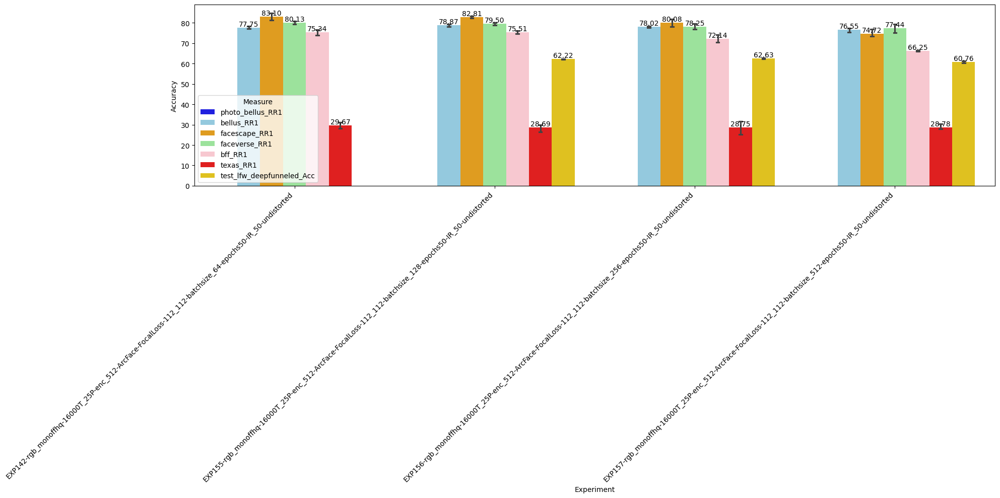

C:\Users\Eduard\AppData\Local\Temp\ipykernel_11156\4151058673.py:30: UserWarning: The palette list has more values (7) than needed (5), which may not be intended.
  ax = sns.barplot(data=df_melted, x='ml_run_experiment', y='Value', hue='Measure', errorbar=('ci', 95), capsize=0.1, palette=color_list)


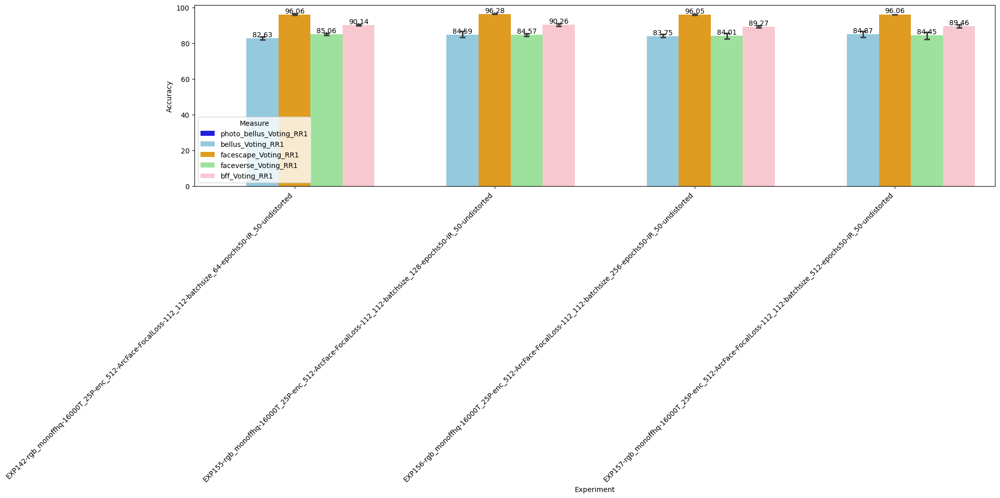

In [108]:
df_selected = select_runs(df_runs, run_configs, ['EXP142-','EXP155-','EXP156-','EXP157-','EXP158-'])
analyze_accuracies(df_selected, run_configs, voting=False)
analyze_accuracies(df_selected, run_configs, voting=True)

### Various Experiments: rgb_monoffhq-12000T, Batchsize, Optimizer

Selected: 11 ['486073039784939573', '486073039784939573', '486073039784939573', '630258576004060678', '630258576004060678', '644353926734686758', '644353926734686758', '644353926734686758', '885266078925377588', '885266078925377588', '885266078925377588']


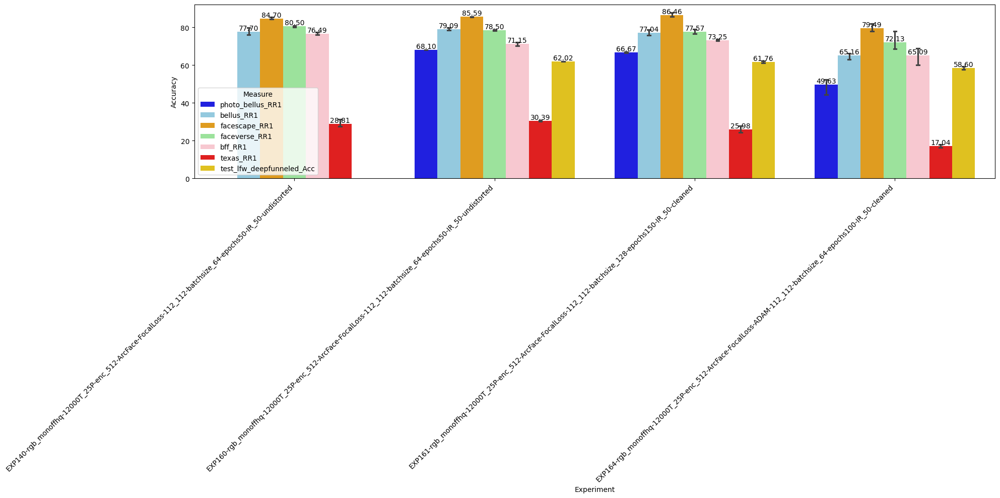

C:\Users\Eduard\AppData\Local\Temp\ipykernel_33516\4151058673.py:30: UserWarning: The palette list has more values (7) than needed (5), which may not be intended.
  ax = sns.barplot(data=df_melted, x='ml_run_experiment', y='Value', hue='Measure', errorbar=('ci', 95), capsize=0.1, palette=color_list)


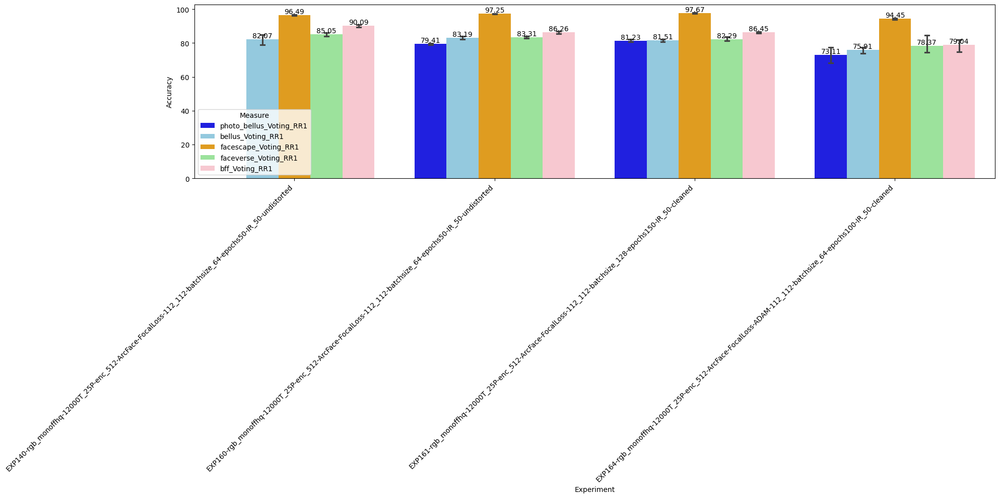

C:\Users\Eduard\AppData\Local\Temp\ipykernel_33516\4151058673.py:30: UserWarning: The palette list has more values (7) than needed (5), which may not be intended.
  ax = sns.barplot(data=df_melted, x='ml_run_experiment', y='Value', hue='Measure', errorbar=('ci', 95), capsize=0.1, palette=color_list)


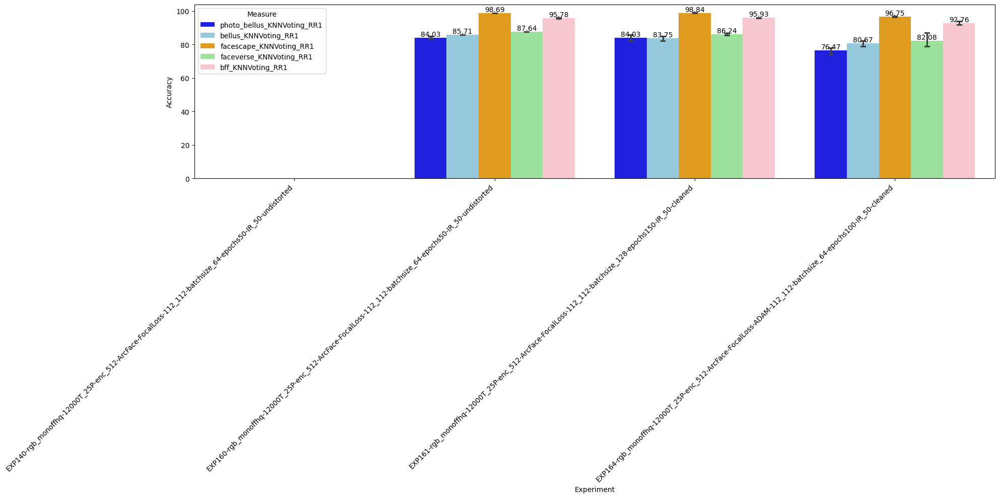

In [9]:
df_selected = select_runs(df_runs, run_configs, ['EXP140-','EXP160-','EXP161-','EXP164-'])#'EXP163-'#
analyze_accuracies(df_selected, run_configs, voting=False)
analyze_accuracies(df_selected, run_configs, voting=True)
analyze_accuracies(df_selected, run_configs, voting='KNN')

### Pretrained or MS1M

Selected: 54 ['295374129134412799', '295374129134412799', '295374129134412799', '295374129134412799', '295374129134412799', '295374129134412799', '429894256967425996', '429894256967425996', '429894256967425996', '431177017085055580', '431177017085055580', '431177017085055580', '435513450754046311', '435513450754046311', '435513450754046311', '435513450754046311', '435513450754046311', '435513450754046311', '593191700125461120', '593191700125461120', '593191700125461120', '593191700125461120', '593191700125461120', '593191700125461120', '597880166159020384', '630258576004060678', '630258576004060678', '633297801724836053', '633297801724836053', '633297801724836053', '633297801724836053', '633297801724836053', '661693618452725019', '705587888683994844', '705587888683994844', '726623495571433660', '726623495571433660', '726623495571433660', '726623495571433660', '726623495571433660', '726623495571433660', '758450912129564453', '758450912129564453', '758450912129564453', '75845091212956445

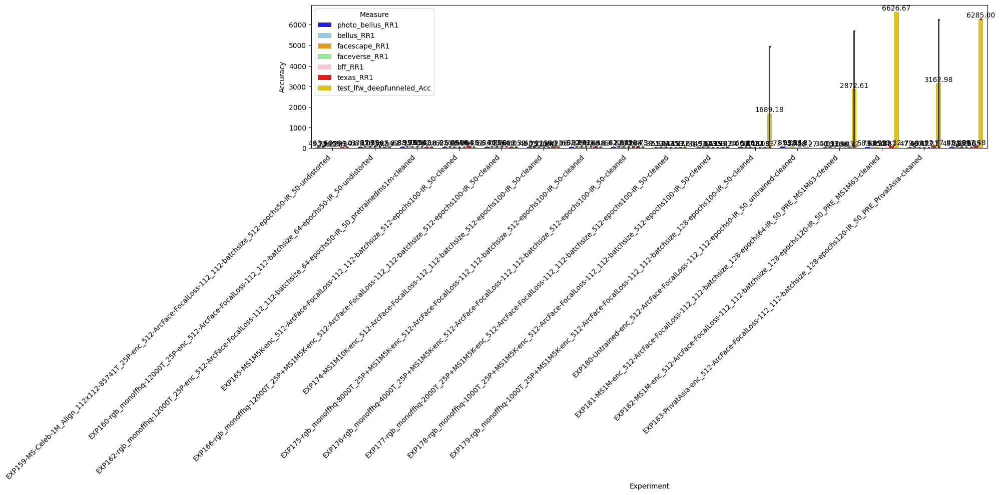

C:\Users\Eduard\AppData\Local\Temp\ipykernel_19552\4151058673.py:30: UserWarning: The palette list has more values (7) than needed (5), which may not be intended.
  ax = sns.barplot(data=df_melted, x='ml_run_experiment', y='Value', hue='Measure', errorbar=('ci', 95), capsize=0.1, palette=color_list)


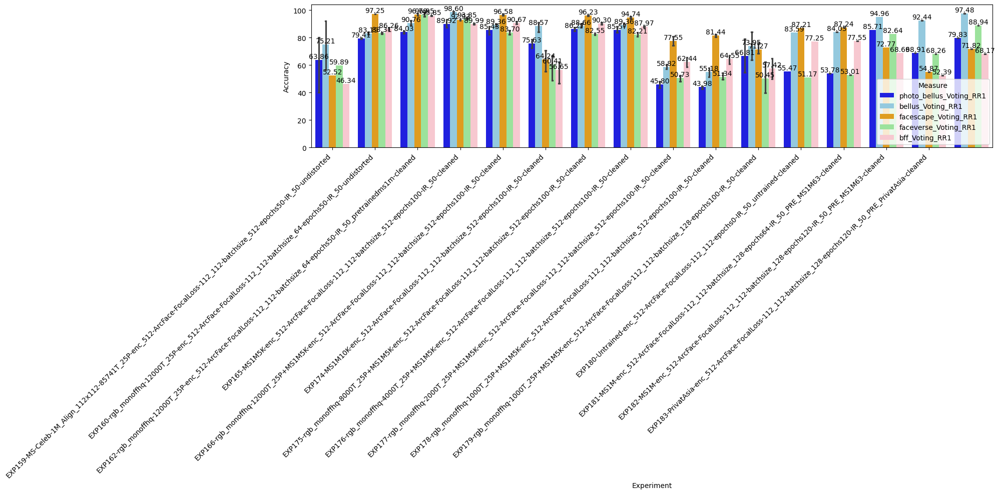

C:\Users\Eduard\AppData\Local\Temp\ipykernel_19552\4151058673.py:30: UserWarning: The palette list has more values (7) than needed (5), which may not be intended.
  ax = sns.barplot(data=df_melted, x='ml_run_experiment', y='Value', hue='Measure', errorbar=('ci', 95), capsize=0.1, palette=color_list)


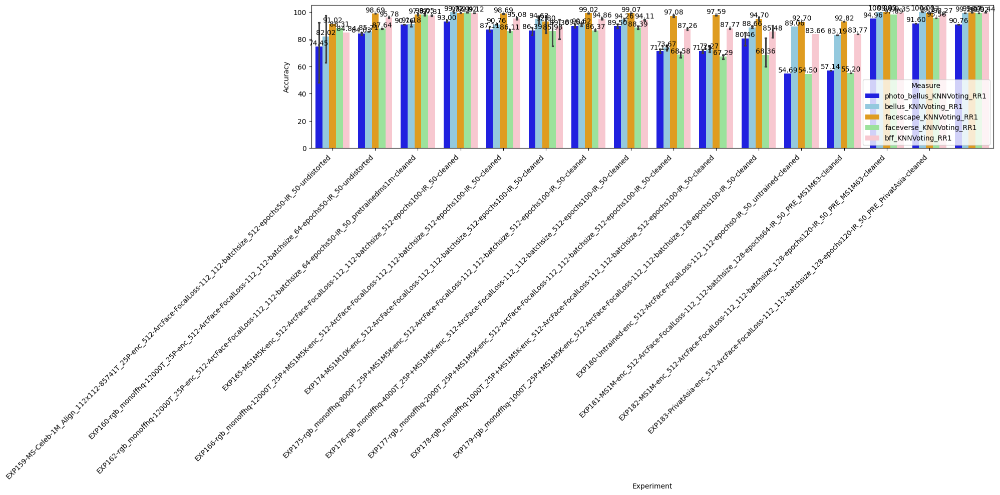

In [7]:
df_selected = select_runs(df_runs, run_configs, ['EXP159-','EXP160-','EXP162-','EXP165-','EXP166-','EXP174-','EXP175-','EXP176-','EXP177-','EXP178-','EXP179-','EXP180-','EXP181-','EXP182-','EXP183-'])
analyze_accuracies(df_selected, run_configs, voting=False)
analyze_accuracies(df_selected, run_configs, voting=True)
analyze_accuracies(df_selected, run_configs, voting='KNN')

### Various Models

Selected: 14 ['106668452033972343', '106668452033972343', '498028882135785560', '498028882135785560', '498028882135785560', '570894296705716622', '570894296705716622', '570894296705716622', '714461256700554288', '714461256700554288', '714461256700554288', '793018124530993968', '793018124530993968', '793018124530993968']


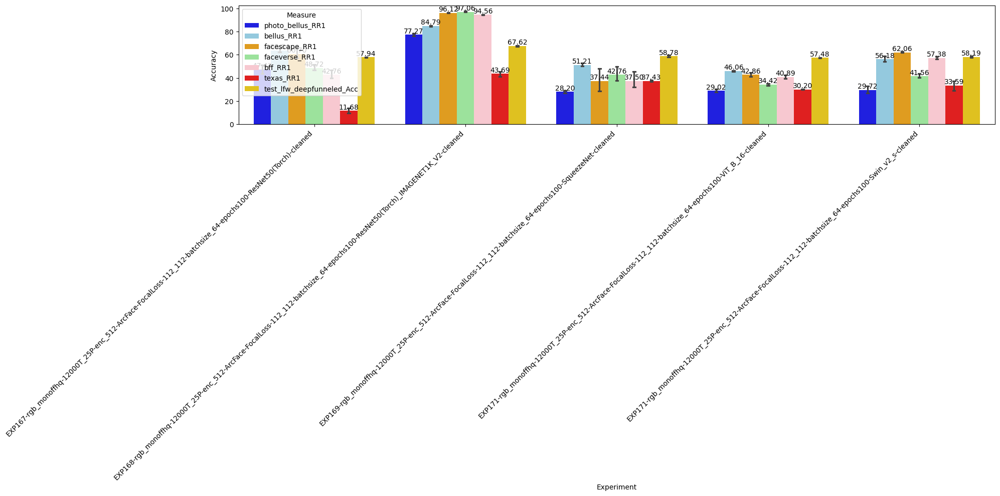

C:\Users\Eduard\AppData\Local\Temp\ipykernel_19552\4151058673.py:30: UserWarning: The palette list has more values (7) than needed (5), which may not be intended.
  ax = sns.barplot(data=df_melted, x='ml_run_experiment', y='Value', hue='Measure', errorbar=('ci', 95), capsize=0.1, palette=color_list)


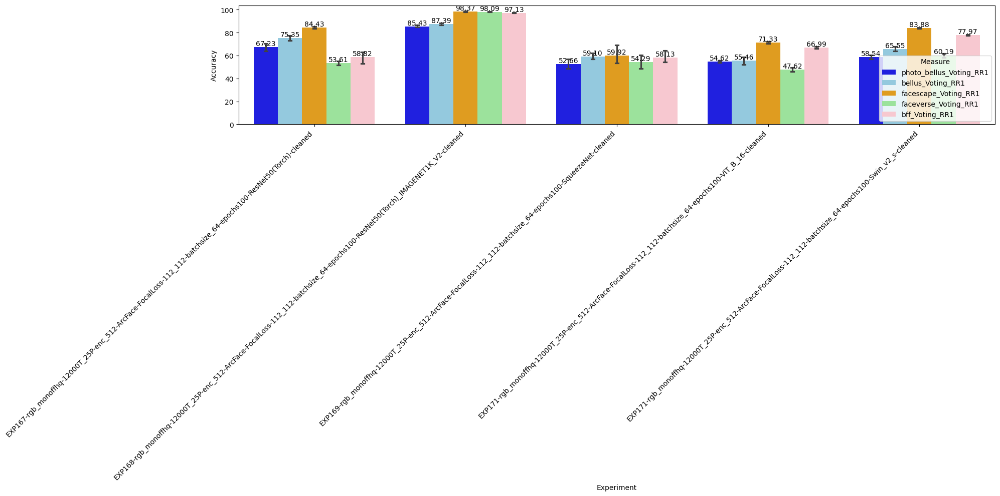

C:\Users\Eduard\AppData\Local\Temp\ipykernel_19552\4151058673.py:30: UserWarning: The palette list has more values (7) than needed (5), which may not be intended.
  ax = sns.barplot(data=df_melted, x='ml_run_experiment', y='Value', hue='Measure', errorbar=('ci', 95), capsize=0.1, palette=color_list)


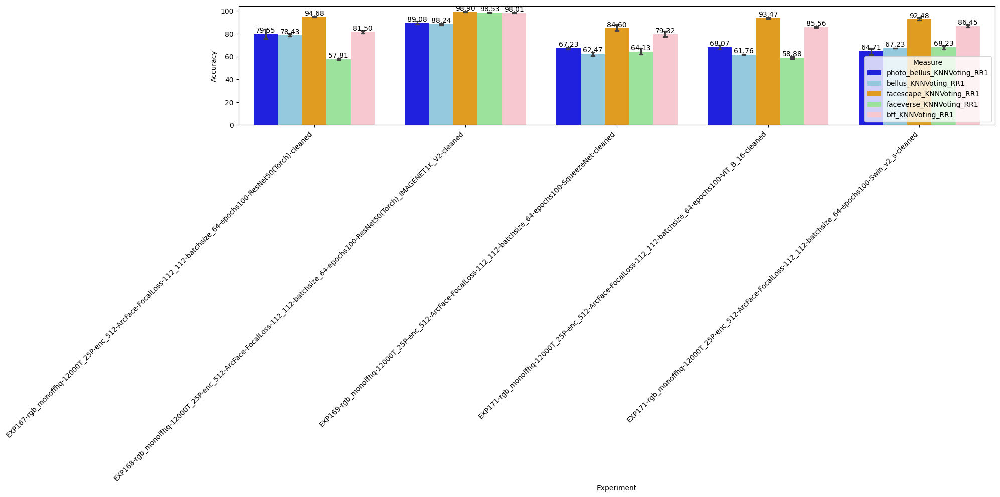

In [8]:
df_selected = select_runs(df_runs, run_configs, ['EXP167-','EXP168-','EXP169-','EXP170-','EXP171-','EXP172-'])
analyze_accuracies(df_selected, run_configs, voting=False)
analyze_accuracies(df_selected, run_configs, voting=True)
analyze_accuracies(df_selected, run_configs, voting='KNN')

Selected: 6 ['345745872272314405', '345745872272314405', '345745872272314405', '603270065320651734', '603270065320651734', '603270065320651734']


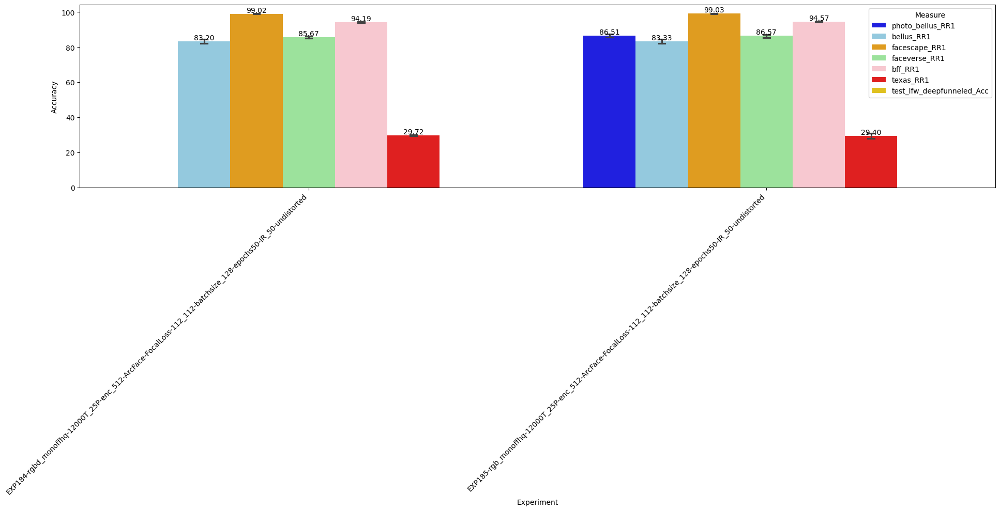

C:\Users\Eduard\AppData\Local\Temp\ipykernel_19552\4151058673.py:30: UserWarning: The palette list has more values (7) than needed (5), which may not be intended.
  ax = sns.barplot(data=df_melted, x='ml_run_experiment', y='Value', hue='Measure', errorbar=('ci', 95), capsize=0.1, palette=color_list)


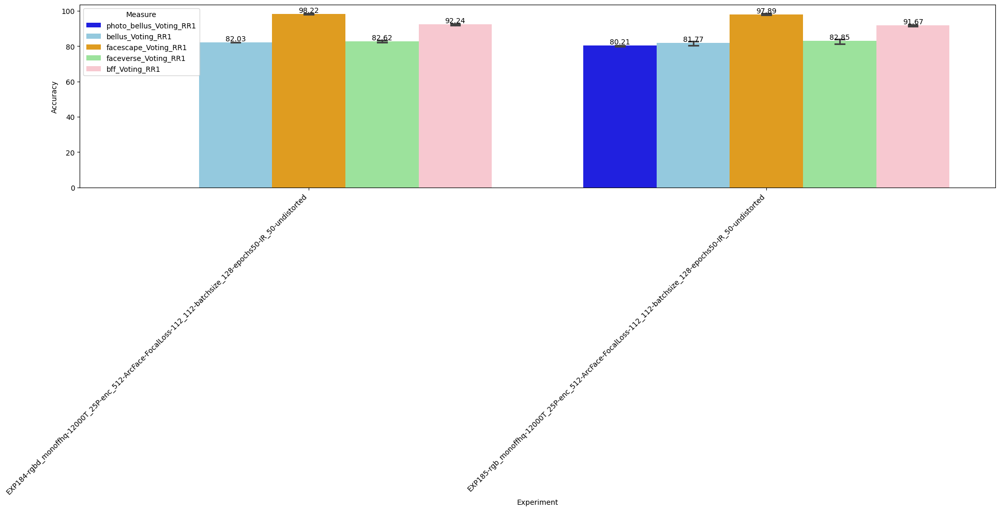

C:\Users\Eduard\AppData\Local\Temp\ipykernel_19552\4151058673.py:30: UserWarning: The palette list has more values (7) than needed (5), which may not be intended.
  ax = sns.barplot(data=df_melted, x='ml_run_experiment', y='Value', hue='Measure', errorbar=('ci', 95), capsize=0.1, palette=color_list)


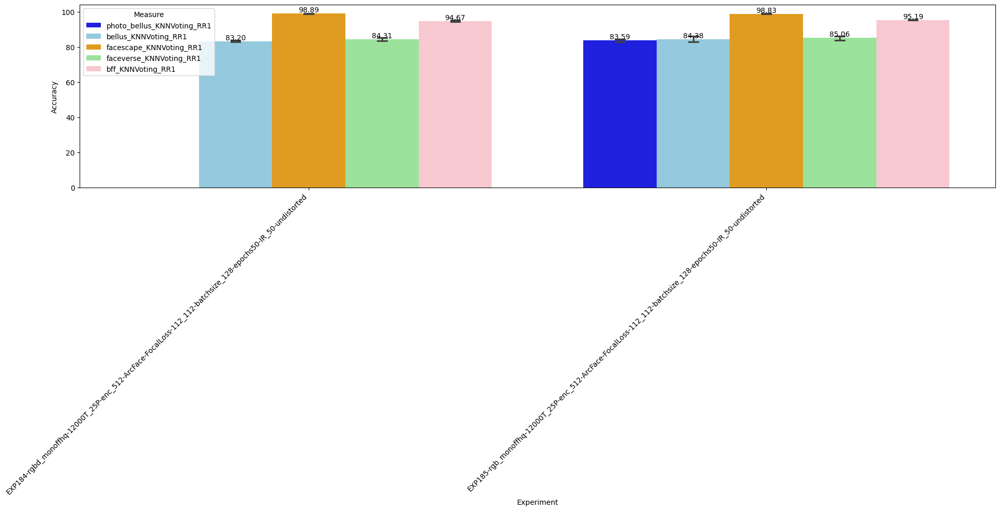

In [10]:
#df_selected = select_runs(df_runs, run_configs, ['EXP180-','EXP181-','EXP182-','EXP183-','EXP184-','EXP185-'])
df_selected = select_runs(df_runs, run_configs, ['EXP184-','EXP185-'])
analyze_accuracies(df_selected, run_configs, voting=False)
analyze_accuracies(df_selected, run_configs, voting=True)
analyze_accuracies(df_selected, run_configs, voting='KNN')

In [3]:
def read_metrics_file(file_path):
    df = pd.read_csv(file_path, sep=" ", header=None, names=["Timestamp", "Value", "Label"])[["Value"]].tail(25).max() #.iloc[-1]
    return df

def read_config_file(file_path):
    """
    Read configuration settings from a config.txt file.
    """
    with open(file_path, 'r') as file:
        txt = file.read().replace("device(type='cuda', index=0)", "0")
        config = ast.literal_eval(txt)
    return config

def read_metrics_and_config_from_directory(directory_root):
    """
    Read metrics from all files in a directory and its subdirectories recursively.
    """
    
    run_data = {}
    runs_path = Path(directory_root)
    # Iterate over all runs
    for run_dir in runs_path.glob('**/metrics'):
        metric_data = {}
        for metric_file in run_dir.iterdir():
            metric_data[metric_file.stem] = read_metrics_file(metric_file)
        
        if len(metric_data) == 0:
            print(metric_data)
            print(run_dir)
        combined_df = pd.concat(metric_data, axis=1)
        run_data[(run_dir.parent.parent.name, run_dir.parent.name)] = combined_df

    run_configs = {}
    # Iterate over all runs
    for run_dir in runs_path.glob('**/params'):
        for metric_file in run_dir.iterdir():
            config = read_config_file(metric_file)
        run_configs[(run_dir.parent.parent.name, run_dir.parent.name)] = config

    return run_data, run_configs

def load_dataframe(directory):
    # Read metrics from all files in the directory
    run_data, run_configs = read_metrics_and_config_from_directory(directory)

    modified_dfs = []
    for key, df in run_data.items():
        df['ml_run_experiment'] = key[0]
        df['ml_run_id'] = key[1]
        df['ml_run_name'] = run_configs[key]['RUN_NAME']
        modified_dfs.append(df)
    df_runs = pd.concat(modified_dfs, axis=0, ignore_index=True)
     
    return df_runs, run_configs

# Define the directory containing metric files
directory = 'E:\\Download\\mlruns'
df_runs, run_configs = load_dataframe(directory)
print(df_runs.shape, len(run_configs.items()))
df_runs.head(5)

(3, 41) 3


,bff_crop_Concat-RR1,bff_crop_Concat-RR5,bff_crop_Concat_Mean-RR1,bff_crop_Concat_Mean-RR5,bff_crop_Concat_PCA-RR1,bff_crop_Concat_PCA-RR5,bff_crop_Front-RR1,bff_crop_Front-RR5,bff_crop_MV-RR1,bff_crop_MV-RR5,nersemble_Concat-RR1,nersemble_Concat-RR5,nersemble_Concat_Mean-RR1,nersemble_Concat_Mean-RR5,nersemble_Front-RR1,nersemble_Front-RR5,nersemble_MV-RR1,nersemble_MV-RR5,Training_Accuracy,train_loss,vox2test_Concat-RR1,vox2test_Concat-RR5,vox2test_Concat_Mean-RR1,vox2test_Concat_Mean-RR5,vox2test_Front-RR1,vox2test_Front-RR5,vox2test_MV-RR1,vox2test_MV-RR5,vox2train_Concat-RR1,vox2train_Concat-RR5,vox2train_Concat_Mean-RR1,vox2train_Concat_Mean-RR5,vox2train_Concat_PCA-RR1,vox2train_Concat_PCA-RR5,vox2train_Front-RR1,vox2train_Front-RR5,vox2train_MV-RR1,vox2train_MV-RR5,ml_run_experiment,ml_run_id,ml_run_name
0,99.7705,99.9359,98.2492,99.4288,99.7224,99.9733,97.9075,99.2634,99.6263,99.9573,88.4068,92.0282,78.5185,84.7972,76.5315,80.6467,93.4744,95.2969,0.000000,38.083205,97.2668,98.9568,83.2464,93.6783,80.1586,90.7991,97.0582,98.9359,85.0321,90.7115,54.9047,68.0548,86.5234,91.4608,58.0925,69.7068,86.6511,91.4550,313193843584883898,b240861c39ab4006a7c6f11269e830aa,EXP198-IR_MV_50_MSCELEB-BFFC1033-MA12345-ArcFa...
1,99.8879,99.9893,98.5694,99.6637,99.8505,99.9893,98.6922,99.6584,99.7438,99.9786,85.3263,89.8295,70.5115,80.4468,76.5785,80.9641,92.2281,94.9324,0.000000,38.241733,90.7991,97.5798,71.2497,87.7738,72.5224,87.7530,90.4027,97.6424,71.4457,82.3137,41.0908,56.3321,74.2416,83.9521,45.6285,60.2670,75.1789,84.4027,411560506513308026,d50d3cf9a4b14e1ba5a2c58bb4c73439,EXP199-IR_MV_50_Asia-BFFC1033-MA12345-ArcFace-...
2,99.7705,99.9359,98.2492,99.4288,99.7224,99.9733,97.9075,99.2634,99.8132,99.9893,88.4068,92.0282,78.5185,84.7972,76.5315,80.6467,93.1687,94.9912,5.976721,38.024269,97.2668,98.9568,83.2464,93.6783,80.1586,90.7991,96.4114,98.8525,85.0321,90.7115,54.9047,68.0548,86.5234,91.4608,58.0925,69.7068,85.8811,90.8996,725448949036268329,e57200f1c6dc426793147a5795b39f9d,EXP200-IR_MV_50_MSCELEB-BFFC1033-MA1234TA5-Arc...


In [56]:
def plot_bar(df, dataset, rotation=45, figsize=(20, 10), ylim=(0,100), id_vars='ml_run_experiment', color_list=['blue','skyblue', 'orange', 'lightgreen','pink','red','gold']) :

    ml_run_name = df['ml_run_name']
    xticks = []
    [xticks.append(x) for x in ml_run_name if x not in xticks]

    indices = np.arange(len(xticks))

    test_columns_raw = [dataset+'_Front-RR1', 
                    dataset+'_Concat-RR1', 
                    dataset+'_Concat_PCA-RR1', 
                    dataset+'_Concat_Mean-RR1', 
                    dataset+'_MV-RR1']
    test_columns = []
    for i in test_columns_raw:
        if i in df.columns:
            test_columns.append(i)
    
    df_melted = pd.melt(df, id_vars=[id_vars], value_vars=test_columns, var_name='Measure', value_name='Value')

    plt.figure(figsize=figsize)
    ax = sns.barplot(data=df_melted, x='ml_run_experiment', y='Value', hue='Measure', errorbar=('ci', 95), capsize=0.1, palette=color_list)
    ax.legend_.remove()

        # Add vertical Measure labels on each bar
    for container, measure in zip(ax.containers, df_melted['Measure'].unique()):
        for bar in container:
            height = bar.get_height()
            ax.text(
                bar.get_x() + bar.get_width() / 2,
                height,
                measure,
                ha='center',
                va='bottom',
                rotation=90,
                fontsize=8,
                color='black'
            )

    for container in ax.containers:
        ax.bar_label(
            container,
            fmt="%.3f",
            label_type="edge",
            padding=3,
            bbox=dict(boxstyle="round,pad=0.3", facecolor="white", edgecolor="black", linewidth=0.5)
        )

    plt.xlabel('Experiment')
    plt.ylabel('Accuracy')
    plt.ylim(ylim)
    plt.xticks(indices, xticks, rotation=rotation, ha='right')
    plt.tight_layout()


def plot_scatter_with_correlation_line(x, y, labels, xlabel, ylabel):
    plt.figure(figsize=(7, 7))
    coefficients = np.polyfit(x, y, 1)
    poly = np.poly1d(coefficients)
    val_linspace = np.linspace(min(x), max(x), len(x))
    plt.scatter(x, y, color='green')
    plt.plot(val_linspace, poly(val_linspace), color='blue', linestyle='dashed', linewidth=2)
    for i, label in enumerate(labels):
        plt.text(x.iloc[i], y.iloc[i], label, fontsize=9, ha='right')
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.tight_layout()
    correlation_coefficient, _ = pearsonr(x, y)
    print(f"Correlation coefficient: {correlation_coefficient:.3f}")
    
    
def analyze_accuracies2(df, datasets, id_vars='ml_run_experiment', ylim=[(0,100),(0,100),(0,100),(0,100)]):
    for d,y in zip(datasets, ylim):
        plot_bar(df, id_vars=id_vars, ylim=y, dataset=d)
        plt.show()

def select_runs(df, run_configs, rules):

    valid_keys = []
    for k,v in run_configs.items():
        accept = False
        for i in rules:
            if i in v['RUN_NAME']:
                accept = True
                break
        if accept:
            valid_keys.append(k[0])

    print('Selected:', len(valid_keys), valid_keys)

    filtered_df = df[df['ml_run_experiment'].isin(valid_keys)].copy()
    
    if filtered_df.shape[0] != len(valid_keys):
        print(filtered_df.shape[0], len(valid_keys))
        print(len(valid_keys), valid_keys)
        print(filtered_df.head())
        raise Exception('filtered_df.shape[0] != len(valid_keys)')

    filtered_df['exp_id'] = filtered_df['ml_run_name'].str.extract(r'EXP(\d+)', expand=False).astype(int)
    filtered_df = filtered_df.sort_values('exp_id')
    return filtered_df



def compare(df, run_configs, experiments_list):
    columns_to_calculate = ['bellus_Voting_RR1', 'facescape_Voting_RR1', 'faceverse_Voting_RR1', 'texas_Voting_RR1']

    groups = []
    for i in experiments_list:
        groups.append(select_runs(df_runs, run_configs, i)[columns_to_calculate].mean())
    
    combined_means = pd.concat(groups, axis=1).T

    ax = combined_means.plot(kind='bar', figsize=(10, 6))
    plt.title('Comparison')
    plt.xlabel('Columns')
    plt.ylabel('Mean Value')
    plt.xticks(rotation=0)
    plt.legend(title='Groups')
    for p in ax.patches:
        ax.annotate(f'{p.get_height():.2f}', 
                    (p.get_x() + p.get_width() / 2., p.get_height()), 
                    ha='center', va='center', 
                    xytext=(0, 9), textcoords='offset points')
    plt.show()


### EXP [200-208] \<rgb_bffT1033, vox2testT188, vox2trainT6000\>_25P-enc_512-ArcFace-FocalLoss-112_112-batchsize_8-epochs15-IR_MV_50-undistored

Selected: 2 ['313193843584883898', '725448949036268329']


C:\Users\Eduard-Desktop\AppData\Local\Temp\ipykernel_19384\4086713521.py:22: UserWarning: The palette list has more values (7) than needed (5), which may not be intended.
  ax = sns.barplot(data=df_melted, x='ml_run_experiment', y='Value', hue='Measure', errorbar=('ci', 95), capsize=0.1, palette=color_list)


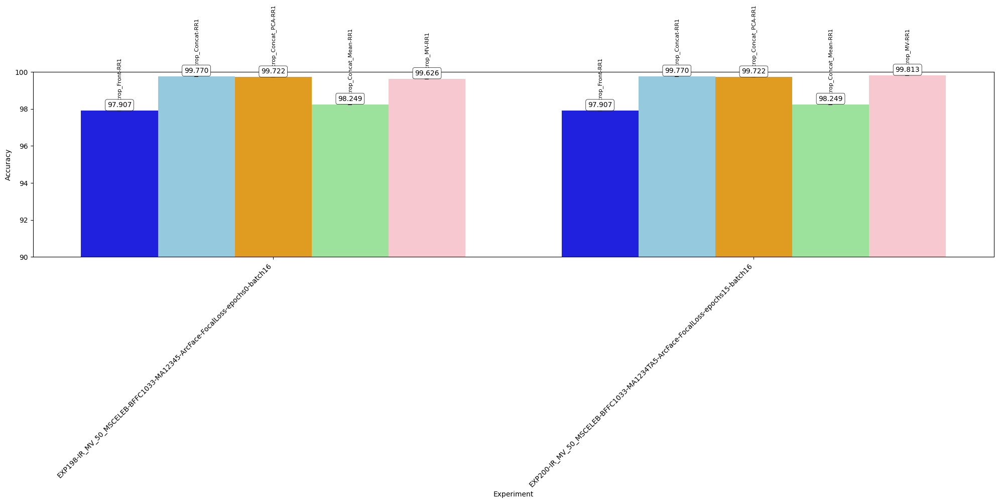

C:\Users\Eduard-Desktop\AppData\Local\Temp\ipykernel_19384\4086713521.py:22: UserWarning: The palette list has more values (7) than needed (4), which may not be intended.
  ax = sns.barplot(data=df_melted, x='ml_run_experiment', y='Value', hue='Measure', errorbar=('ci', 95), capsize=0.1, palette=color_list)


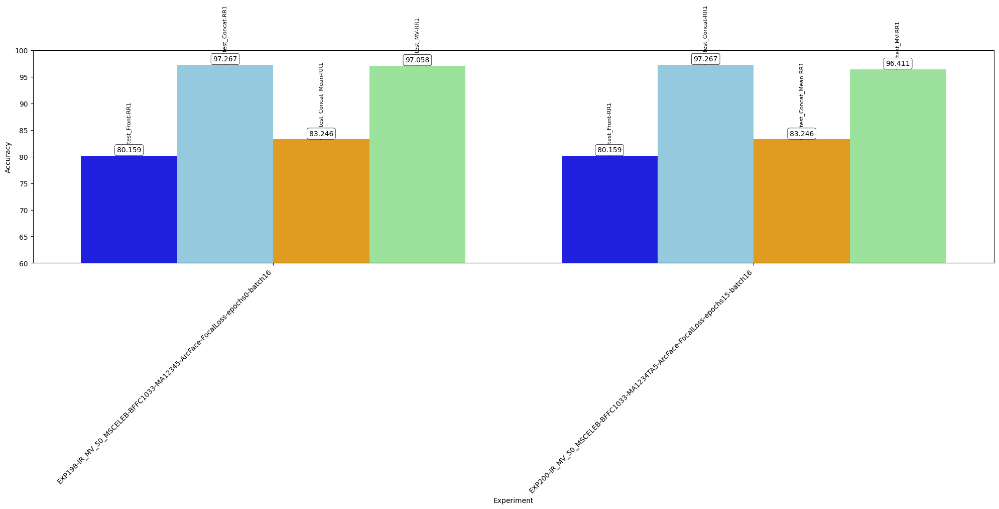

C:\Users\Eduard-Desktop\AppData\Local\Temp\ipykernel_19384\4086713521.py:22: UserWarning: The palette list has more values (7) than needed (5), which may not be intended.
  ax = sns.barplot(data=df_melted, x='ml_run_experiment', y='Value', hue='Measure', errorbar=('ci', 95), capsize=0.1, palette=color_list)


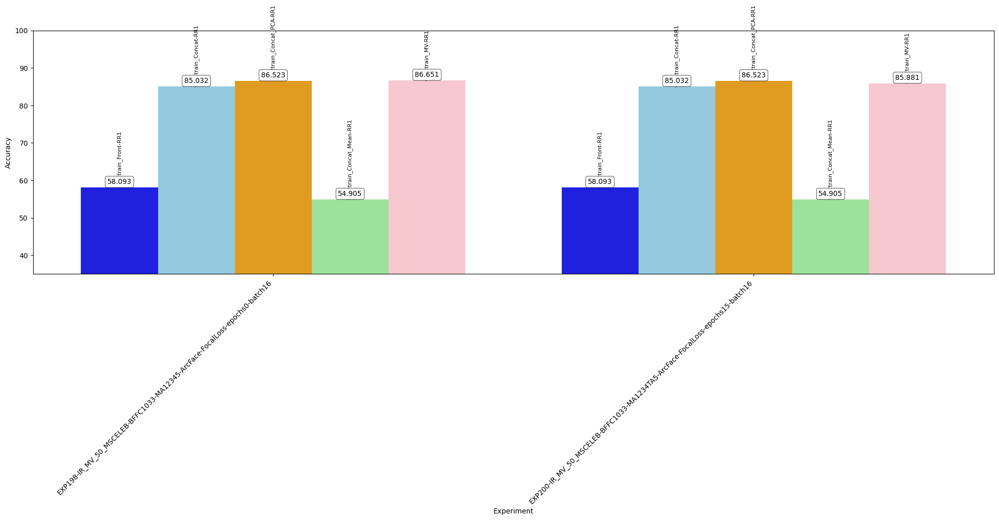

C:\Users\Eduard-Desktop\AppData\Local\Temp\ipykernel_19384\4086713521.py:22: UserWarning: The palette list has more values (7) than needed (4), which may not be intended.
  ax = sns.barplot(data=df_melted, x='ml_run_experiment', y='Value', hue='Measure', errorbar=('ci', 95), capsize=0.1, palette=color_list)


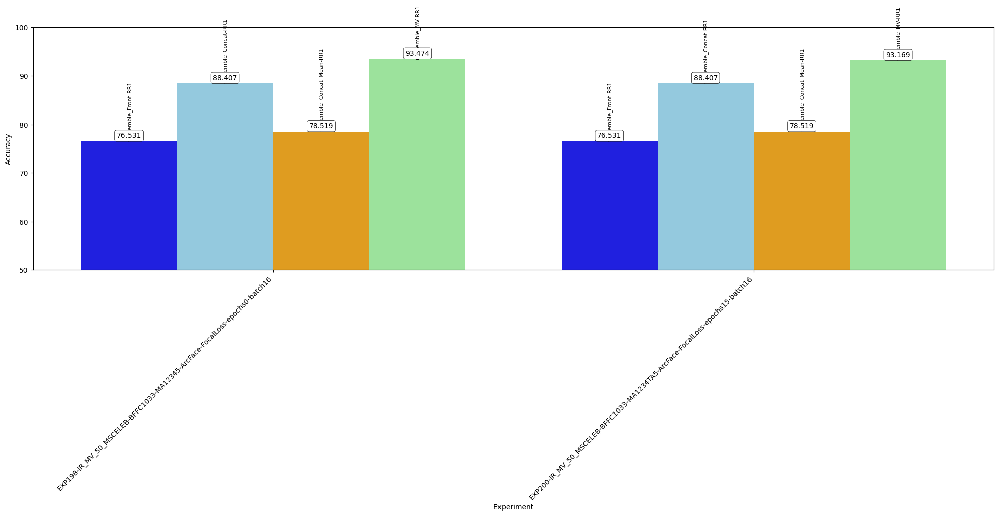

In [57]:
df_selected = select_runs(df_runs, run_configs, ['EXP198-','EXP200-'])#,'EXP182-','EXP183-','EXP184-','EXP185-'])
analyze_accuracies2(df_selected, datasets=['bff_crop','vox2test','vox2train','nersemble'], ylim=[(90,100),(60,100),(35,100),(50,100)])